# [**AN2DL project 1: time series classification**](https://www.kaggle.com/competitions/an2dl2526c2/overview)

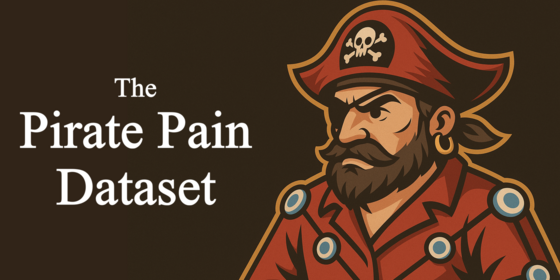

Portions of this code are licensed under Apache License 2.0

Copyright 2025 Eugenio Lomurno, Alberto Archetti, Roberto Basla, Carlo Sgaravatti

https://www.apache.org/licenses/LICENSE-2.0

# **Team information**
Group name: The Underfitters

Student 1:
*   Ilyas Benkirane
*   295150
*   ilyas.benkirane@mail.polimi.it

Student 2:
*   Anatole Lecomte
*   294859
*   anatoletitouan.lecomte@mail.polimi.it

Student 3:
*   Nathan Luneau
*   295387
*   nathan.luneau@mail.polimi.it

# **Import libraries**

We import all the libraries and modules that will be necessary

In [ ]:
# Set seed for reproducibility
SEED = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(SEED)
random.seed(SEED)

# Import PyTorch
import torch
torch.manual_seed(SEED)
from torch import nn
# from torchsummary import summary
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import TensorDataset, DataLoader
logs_dir = "tensorboard"
!pkill -f tensorboard
%load_ext tensorboard
!mkdir -p models

if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True
else:
    device = torch.device("cpu")

print(f"PyTorch version: {torch.__version__}")
print(f"Device: {device}")

# Import other libraries
import copy
import shutil
from itertools import product
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

PyTorch version: 2.8.0+cu126
Device: cuda


# **Importing data from kaggle**

We import the data from kaggle using the token that can be found in the profile of the user

In [ ]:
from google.colab import files
files.upload()  ## Download kaggle token and upload it

# Check if kaggle token exists
if not os.path.exists("/root/.kaggle/"):
  !mkdir ~/.kaggle/
  !mv kaggle.json ~/.kaggle/
  !chmod 600 ~/.kaggle/kaggle.json

!kaggle competitions download -c an2dl2526c1
!unzip an2dl2526c1.zip -d data/

Saving kaggle.json to kaggle.json
  0% 0.00/82.0M [00:00<?, ?B/s]
100% 82.0M/82.0M [00:00<00:00, 1.76GB/s]
Archive:  an2dl2526c1.zip
  inflating: data/pirate_pain_test.csv  
  inflating: data/pirate_pain_train.csv  
  inflating: data/pirate_pain_train_labels.csv  
  inflating: data/sample_submission.csv  


## Loading data

In [ ]:
import pandas as pd

X = pd.read_csv('data/pirate_pain_train.csv')
y = pd.read_csv('data/pirate_pain_train_labels.csv')
X_final_test = pd.read_csv('data/pirate_pain_test.csv')

After loading all the data, we can see the shape of the data

In [ ]:
print("Shape of the pirate pain train set :",X.shape, "\n")
display(X)
print("Shape of the labels :",y.shape, "\n")
display(y)

Shape of the pirate pain train set : (105760, 40) 



,sample_index,time,pain_survey_1,pain_survey_2,pain_survey_3,pain_survey_4,n_legs,n_hands,n_eyes,joint_00,...,joint_21,joint_22,joint_23,joint_24,joint_25,joint_26,joint_27,joint_28,joint_29,joint_30
0,0,0,2,0,2,1,two,two,two,1.094705,...,3.499558e-06,1.945042e-06,3.999558e-06,1.153299e-05,3.805930e-06,0.017592,0.013508,0.026798,0.027815,0.5
1,0,1,2,2,2,2,two,two,two,1.135183,...,3.976952e-07,6.765107e-07,6.019627e-06,4.643774e-08,0.000000e+00,0.013352,0.000000,0.013377,0.013716,0.5
2,0,2,2,0,2,2,two,two,two,1.080745,...,1.533820e-07,1.698525e-07,1.446051e-06,2.424536e-06,2.513519e-06,0.016225,0.008110,0.024097,0.023105,0.5
3,0,3,2,2,2,2,two,two,two,0.938017,...,1.006865e-05,5.511079e-07,1.847597e-06,5.432416e-08,0.000000e+00,0.011832,0.007450,0.028613,0.024648,0.5
4,0,4,2,2,2,2,two,two,two,1.090185,...,4.437266e-06,1.735459e-07,1.552722e-06,5.825366e-08,7.044832e-06,0.005360,0.002532,0.033026,0.025328,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105755,660,155,2,2,0,0,two,two,two,1.051738,...,0.000000e+00,3.586810e-07,2.929207e-09,3.722175e-07,9.919764e-07,0.007856,0.026876,0.173566,0.221921,0.5
105756,660,156,2,2,0,2,two,two,two,1.027651,...,1.457610e-06,3.588733e-07,0.000000e+00,2.059047e-07,3.802923e-06,0.026795,0.012778,0.075945,0.116763,0.5
105757,660,157,0,2,2,2,two,two,two,1.113381,...,0.000000e+00,3.590534e-07,2.422390e-06,2.029416e-07,6.218436e-06,0.036982,0.028014,0.075978,0.078339,0.5
105758,660,158,2,2,2,2,two,two,two,1.058100,...,1.745987e-07,3.592213e-07,6.060577e-07,1.999436e-07,9.895764e-07,0.046405,0.017922,0.097109,0.106807,0.5


Shape of the labels : (661, 2) 



,sample_index,label
0,0,no_pain
1,1,no_pain
2,2,low_pain
3,3,no_pain
4,4,no_pain
...,...,...
656,656,no_pain
657,657,no_pain
658,658,no_pain
659,659,no_pain


In [ ]:
X.describe()
# This function allows us to see the statistical informations for each feature.
# We can see for example that the joint 30 never changes (std = 0)

,sample_index,time,pain_survey_1,pain_survey_2,pain_survey_3,pain_survey_4,joint_00,joint_01,joint_02,joint_03,...,joint_21,joint_22,joint_23,joint_24,joint_25,joint_26,joint_27,joint_28,joint_29,joint_30
count,105760.000000,105760.000000,105760.000000,105760.000000,105760.000000,105760.000000,105760.000000,105760.000000,105760.000000,105760.000000,...,1.057600e+05,1.057600e+05,1.057600e+05,1.057600e+05,1.057600e+05,105760.000000,105760.000000,105760.000000,105760.000000,105760.0
mean,330.000000,79.500000,1.633746,1.654851,1.653640,1.663134,0.943095,0.916955,0.779296,0.767921,...,3.972126e-05,4.176794e-05,3.561780e-05,3.138109e-05,1.024604e-04,0.041905,0.058244,0.049886,0.062273,0.5
std,190.814948,46.187338,0.682423,0.669639,0.666649,0.661994,0.202051,0.197608,0.295605,0.300787,...,4.974496e-03,5.472244e-03,1.235450e-03,4.062914e-04,3.206128e-03,0.060293,0.079819,0.060773,0.072597,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001015,0.005403,...,0.000000e+00,1.510494e-07,0.000000e+00,1.063144e-08,0.000000e+00,0.000203,0.000000,0.000000,0.000000,0.5
25%,165.000000,39.750000,2.000000,2.000000,2.000000,2.000000,0.828277,0.811445,0.568850,0.520020,...,6.545878e-08,3.321650e-07,3.275038e-07,2.841805e-07,7.161332e-07,0.009885,0.012652,0.016290,0.019638,0.5
50%,330.000000,79.500000,2.000000,2.000000,2.000000,2.000000,1.005126,0.979468,0.909549,0.914834,...,8.302747e-07,1.095971e-06,1.024209e-06,8.746147e-07,3.126723e-06,0.021898,0.031739,0.031843,0.039041,0.5
75%,495.000000,119.250000,2.000000,2.000000,2.000000,2.000000,1.081039,1.056611,0.995187,0.994324,...,2.800090e-06,3.079465e-06,3.021830e-06,2.507548e-06,9.946107e-06,0.048579,0.071051,0.058741,0.079518,0.5
max,660.000000,159.000000,2.000000,2.000000,2.000000,2.000000,1.407968,1.334613,1.306046,1.254729,...,1.442198e+00,1.305001e+00,2.742411e-01,3.643074e-02,9.473540e-01,1.223617,1.187419,1.412037,1.370765,0.5


## Visualise the count of pirates for each pain level

We want to see the distribution of the different pain levels

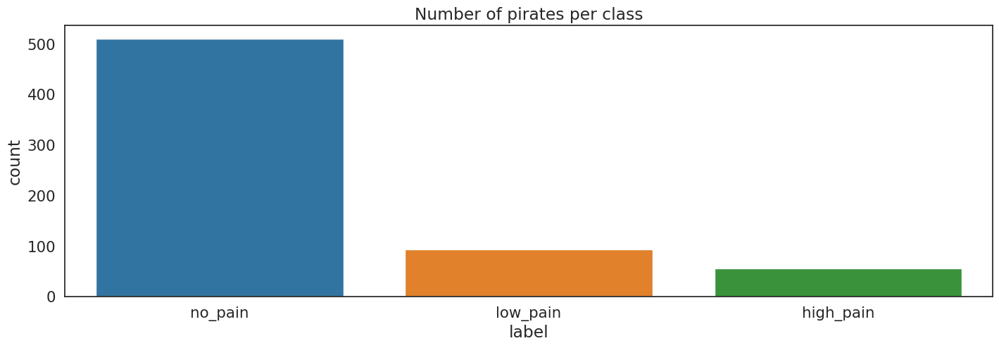

label
no_pain      77.31
low_pain     14.22
high_pain     8.47
Name: proportion, dtype: float64


In [ ]:
# Plot with the number of pirates for each pain level
plt.figure(figsize=(17, 5))
sns.countplot(
    x='label',
    data=y,
    order=y['label'].value_counts().index,
    palette='tab10'
)

# Set the title of the plot
plt.title("Number of pirates per class")

# Display the plot
plt.show()

# We want to know the proportions of each level of pain
print(round(y.label.value_counts(normalize=True) * 100, 2))

Here we can see that the dataset is imbalanced, we have more no_pain (77.3%) than low_pain (14.2%) and high_pain (8.5%)

## Visualizing timeseries data

We can try to see the evolution of different features in time

In [ ]:
# The function plot_variable enables us to see the evolution in time of one feature (variable_name)
# for pirates with different pain levels

def plot_variable(df, n_np, n_lp, n_hp, variable_name):
  """
  Plot the temporal evolution of a given feature for three pirates with
  different pain levels (no pain, low pain, high pain).

  Parameters:
      df (pd.DataFrame): Dataset containing time series for all pirates.
                        Must include columns: 'sample_index', 'time', and the feature name.
      n_np (int): Sample index of the pirate with no pain.
      n_lp (int): Sample index of the pirate with low pain.
      n_hp (int): Sample index of the pirate with high pain.
      variable_name (str): Name of the feature/column to plot over time.
  """

  f, ax = plt.subplots(nrows=3, ncols=1, figsize=(10, 10))

  time = df[df.sample_index == n_np].time.to_list()

  # High pain pirate
  X_train_hp = df[df.sample_index==n_hp]
  var_hp = X_train_hp[variable_name].to_list()

  # Low pain pirate
  X_train_lp = df[df.sample_index==n_lp]
  var_lp = X_train_lp[variable_name].to_list()

  # No pain pirate
  X_train_np = df[df.sample_index==n_np]
  var_np = X_train_np[variable_name].to_list()

  ax[0].plot(time, var_hp, color='red')
  ax[0].set_title(f"Evolution of {variable_name} for high pain pirate n°{n_hp}")
  ax[1].plot(time, var_lp, color='blue')
  ax[1].set_title(f"Evolution of {variable_name} for low pain pirate n°{n_lp}")
  ax[2].plot(time, var_np, color='green')
  ax[2].set_title(f"Evolution of {variable_name} for no pain pirate n°{n_np}")

  plt.show()


high_pain
low_pain
no_pain


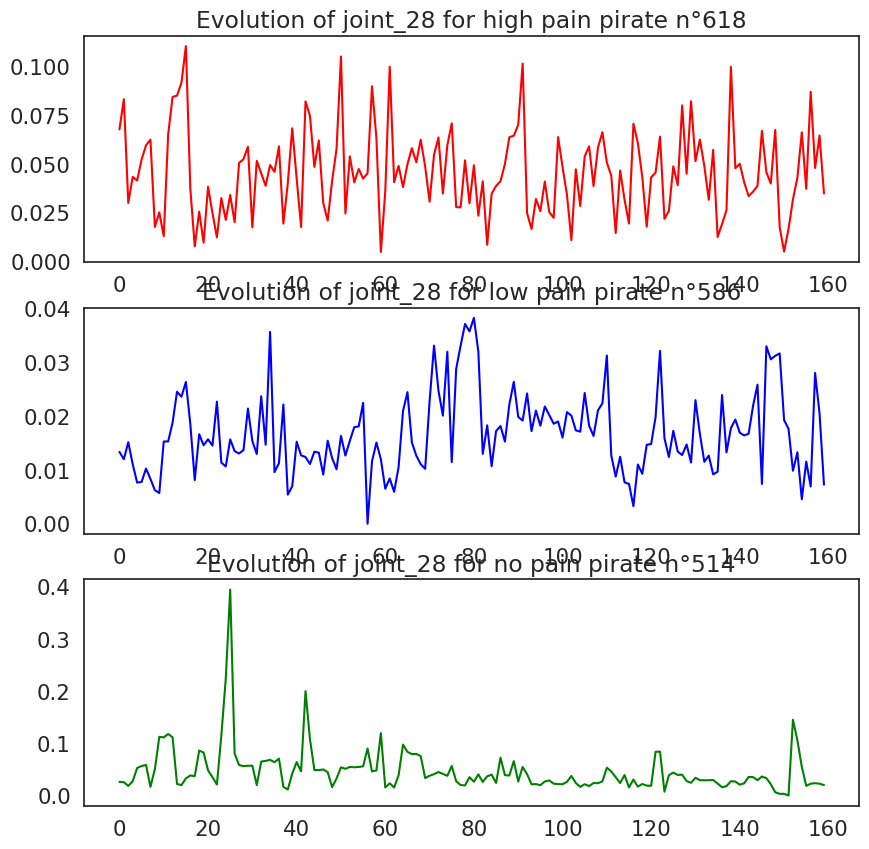

In [ ]:
n_hp = y[y.label == "high_pain"].sample_index.sample().iloc[0]  ## Choses random high pain pirate.
print(y.label.iloc[n_hp])
n_lp = y[y.label == "low_pain"].sample_index.sample().iloc[0]  ## Choses random low pain pirate.
print(y.label.iloc[n_lp])
n_np = y[y.label == "no_pain"].sample_index.sample().iloc[0]  ## Choses random no pain pirate.
print(y.label.iloc[n_np])

plot_variable(X, n_np, n_lp, n_hp, "joint_28")

# **Data preprocessing**

## Mapping level pains and categorical values into numerical values

We map the pain levels and the features that are categorical

In [ ]:
# Define a mapping of pain levels to integer labels
label_mapping = {
    'no_pain': 0,
    'low_pain': 1,
    'high_pain': 2
}

# Define a mapping for the number of hands, legs and eyes.
hands_mapping = {
    'two': 0,
    'one+hook_hand': 1
}

legs_mapping = {
    'two': 0,
    'one+peg_leg': 1
}

eyes_mapping = {
    'two': 0,
    'one+eye_patch': 1
}

# Map pain levels to integers in the training set
y['label'] = y['label'].map(label_mapping)
X['n_eyes'] = X['n_eyes'].map(eyes_mapping)
X['n_hands'] = X['n_hands'].map(hands_mapping)
X['n_legs'] = X['n_legs'].map(legs_mapping)

## Split into training and validation sets

We have to divide the pirates into a training set and a validation set.

- 80% of the pirates are for the training set
- 20% for the validation set

There must be the same proportion of no_pain, low_pain and high_pain in each set.

In [ ]:
# Split: separate 20% samples for the validation set
x_train, x_val, Y_train, Y_val = train_test_split(
    X.sample_index.unique(), # We do the split for each pirate
    y.sample_index.unique(),
    test_size=0.2,
    random_state=50
    )
# ==> 80% training, 20% validation

X_train_df = X[X.sample_index.isin(x_train)]
y_train_df = y[y.sample_index.isin(Y_train)]

X_val_df = X[X.sample_index.isin(x_val)]
y_val_df = y[y.sample_index.isin(Y_val)]

# Now we verify that the proportions are correct :
# 1. This shows that we have 80%, 20%
print(f"Train set size: {x_train.shape[0]} = ", round(x_train.shape[0]/(x_val.shape[0]+x_train.shape[0]),3),"%")
print(f"Validation set size: {x_val.shape[0]} = ", round(x_val.shape[0]/(x_val.shape[0]+x_train.shape[0]),3), "%")
print('')

# 2. This shows the number of pirates for each pain level in the training and validation sets
print(y[y.sample_index.isin(x_train)].label.value_counts())
print(y[y.sample_index.isin(x_val)].label.value_counts())
print('')

# 3. We want to see the proportions in percentages
print(round(y[y.sample_index.isin(x_train)].label.value_counts(normalize=True) * 100,2))
print(round(y[y.sample_index.isin(x_val)].label.value_counts(normalize=True) * 100,2))

Train set size: 528 =  0.799 %
Validation set size: 133 =  0.201 %

label
0    410
1     74
2     44
Name: count, dtype: int64
label
0    101
1     20
2     12
Name: count, dtype: int64

label
0    77.65
1    14.02
2     8.33
Name: proportion, dtype: float64
label
0    75.94
1    15.04
2     9.02
Name: proportion, dtype: float64


## Min-max normalization

We normalise all our features to increase the stability

In [ ]:
# Define the columns to be normalised
features = ['pain_survey_1', 'pain_survey_2', 'pain_survey_3', 'pain_survey_4'] + [f'joint_{i:02d}' for i in range(0, 30)] + ['n_eyes', 'n_hands', 'n_legs']  ## Joint_30 is irrelevant since it's the same all the time for all pirates

# Calculate the minimum and maximum values from the training data only
mins = X_train_df[features].min()
maxs = X_train_df[features].max()

# Apply normalisation to the specified columns in all datasets
for column in features:
    # Normalise the training set
    X_train_df[column] = X_train_df[column].astype(np.float32)
    X_train_df[column] = (X_train_df[column] - mins[column]) / (maxs[column] - mins[column])

    # Normalise the validation set
    X_val_df[column] = X_val_df[column].astype(np.float32)
    X_val_df[column] = (X_val_df[column] - mins[column]) / (maxs[column] - mins[column])

## Windowing

Here, we can choose the length of the data that will be fed to the model (window size), as well as the number windows (defined by the stride)

In [ ]:
WINDOW_SIZE = 100
STRIDE = 10

In [ ]:
# Define a function to build sequences from the dataset
def build_sequences(df, label_df, window=200, stride=100):
    """
    Construct fixed-length sliding-window sequences for each pirate and assign
    the corresponding pain label.

    Parameters:
        df (pd.DataFrame): Time-series dataset containing all pirates.
        label_df (pd.DataFrame): DataFrame mapping each pirate ('sample_index')
                                 to a pain label in a 'label' column.
        window (int): Length of each sequence.
        stride (int): Step size between consecutive windows.

    Returns:
        dataset (np.ndarray): Array of shape (N, window, num_features)
                              containing all constructed sequences.
        labels (np.ndarray): Array of shape (N,) with the labels for each sequence.
    """

    # Ensure the window is dividible by the stride
    assert window % stride == 0

    # Initialize lists to store sequences and their corresponding labels
    dataset = []
    labels = []

    # Iterate over unique pirates in the DataFrame
    for pirate in df['sample_index'].unique():
        # Extract features for the current pirate
        temp = df[df['sample_index'] == pirate][features].values

        # Retrieve the label (pain level) for the current pirate
        label = label_df[label_df['sample_index'] == pirate]['label'].values[0]

        # Zero-padding
        remainder = len(temp) % window
        if remainder > 0:
            padding_len = window - remainder
            padding = np.zeros((padding_len, len(features)), dtype='float32')
            temp = np.concatenate((temp, padding))


        # Build feature windows and associate them with labels
        idx = 0
        while idx + window <= len(temp):
            dataset.append(temp[idx:idx + window])
            labels.append(label)
            idx += stride

    # Convert lists to numpy arrays for further processing
    dataset = np.array(dataset)
    labels = np.array(labels)

    return dataset, labels

In [ ]:
# Generate sequences and labels for the training set
X_train, y_train = build_sequences(X_train_df, y_train_df, WINDOW_SIZE, STRIDE)

# Generate sequences and labels for the validation set
X_val, y_val = build_sequences(X_val_df, y_val_df, WINDOW_SIZE, STRIDE)

# Print the shapes of the generated datasets and their labels
X_train.shape, y_train.shape, X_val.shape, y_val.shape

((5808, 100, 37), (5808,), (1463, 100, 37), (1463,))

## Preparing the input data for the model

In [ ]:
# Define the input shape based on the training data
input_shape = X_train.shape[1:]

# Number of classes (= 3)
num_classes = len(np.unique(y_train))

In [ ]:
# Convert numpy arrays to PyTorch datasets (pairs features with labels)
train_ds = TensorDataset(torch.from_numpy(X_train), torch.from_numpy(y_train))
val_ds = TensorDataset(torch.from_numpy(X_val), torch.from_numpy(y_val))

In [ ]:
# Define the batch size, which is the number of samples in each batch
BATCH_SIZE = 128
# During our experimentations, we tried different values for the batch size :
# 32, 64, 128, 256

def make_loader(ds, batch_size, shuffle, drop_last):
    """
    Create a PyTorch DataLoader
    Parameters:
        ds (Dataset): A PyTorch-compatible dataset.
        batch_size (int): Number of windows per batch.
        shuffle (bool): Whether to shuffle the dataset each epoch.
        drop_last (bool): If True, drop the last incomplete batch.
    Returns:
        DataLoader: PyTorch DataLoader ready for training.
    """

    # Determine optimal number of worker processes for data loading
    cpu_cores = os.cpu_count() or 2
    num_workers = max(2, min(4, cpu_cores))

    # Create DataLoader with performance optimizations
    return DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=num_workers,
        pin_memory=True,  # Faster GPU transfer
        pin_memory_device="cuda" if torch.cuda.is_available() else "",
        prefetch_factor=4,  # Load 4 batches ahead
    )

# Create data loaders with different settings for each set
train_loader = make_loader(train_ds, batch_size=BATCH_SIZE, shuffle=True, drop_last=False)
val_loader   = make_loader(val_ds, batch_size=BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Get one batch from the training data loader
for xb, yb in train_loader:
    print("Shape of one batch:")
    print("Features batch shape:", xb.shape)
    print("Labels batch shape:", yb.shape)
    break # Stop after getting one batch

Shape of one batch:
Features batch shape: torch.Size([128, 100, 37])
Labels batch shape: torch.Size([128])


# **Model building**

In [ ]:
def recurrent_summary(model, input_size):
    """
    Custom summary function that emulates torchinfo's output while correctly
    counting parameters for RNN/GRU/LSTM layers.

    This function is designed for models whose direct children are
    nn.Linear, nn.RNN, nn.GRU, or nn.LSTM layers.

    Args:
        model (nn.Module): The model to analyze.
        input_size (tuple): Shape of the input tensor (e.g., (seq_len, features)).
    """

    # Dictionary to store output shapes captured by forward hooks
    output_shapes = {}
    # List to track hook handles for later removal
    hooks = []

    def get_hook(name):
        """Factory function to create a forward hook for a specific module."""
        def hook(module, input, output):
            # Handle RNN layer outputs (returns a tuple)
            if isinstance(output, tuple):
                # output[0]: all hidden states with shape (batch, seq_len, hidden*directions)
                shape1 = list(output[0].shape)
                shape1[0] = -1  # Replace batch dimension with -1

                # output[1]: final hidden state h_n (or tuple (h_n, c_n) for LSTM)
                if isinstance(output[1], tuple):  # LSTM case: (h_n, c_n)
                    shape2 = list(output[1][0].shape)  # Extract h_n only
                else:  # RNN/GRU case: h_n only
                    shape2 = list(output[1].shape)

                # Replace batch dimension (middle position) with -1
                shape2[1] = -1

                output_shapes[name] = f"[{shape1}, {shape2}]"

            # Handle standard layer outputs (e.g., Linear)
            else:
                shape = list(output.shape)
                shape[0] = -1  # Replace batch dimension with -1
                output_shapes[name] = f"{shape}"
        return hook

    # 1. Determine the device where model parameters reside
    try:
        device = next(model.parameters()).device
    except StopIteration:
        device = torch.device("cpu")  # Fallback for models without parameters

    # 2. Create a dummy input tensor with batch_size=1
    dummy_input = torch.randn(1, *input_size).to(device)

    # 3. Register forward hooks on target layers
    # Iterate through direct children of the model (e.g., self.rnn, self.classifier)
    for name, module in model.named_children():
        if isinstance(module, (nn.Linear, nn.RNN, nn.GRU, nn.LSTM)):
            # Register the hook and store its handle for cleanup
            hook_handle = module.register_forward_hook(get_hook(name))
            hooks.append(hook_handle)

    # 4. Execute a dummy forward pass in evaluation mode
    model.eval()
    with torch.no_grad():
        try:
            model(dummy_input)
        except Exception as e:
            print(f"Error during dummy forward pass: {e}")
            # Clean up hooks even if an error occurs
            for h in hooks:
                h.remove()
            return

    # 5. Remove all registered hooks
    for h in hooks:
        h.remove()

    # --- 6. Print the summary table ---

    print("-" * 79)
    # Column headers
    print(f"{'Layer (type)':<25} {'Output Shape':<28} {'Param #':<18}")
    print("=" * 79)

    total_params = 0
    total_trainable_params = 0

    # Iterate through modules again to collect and display parameter information
    for name, module in model.named_children():
        if name in output_shapes:
            # Count total and trainable parameters for this module
            module_params = sum(p.numel() for p in module.parameters())
            trainable_params = sum(p.numel() for p in module.parameters() if p.requires_grad)

            total_params += module_params
            total_trainable_params += trainable_params

            # Format strings for display
            layer_name = f"{name} ({type(module).__name__})"
            output_shape_str = str(output_shapes[name])
            params_str = f"{trainable_params:,}"

            print(f"{layer_name:<25} {output_shape_str:<28} {params_str:<15}")

    print("=" * 79)
    print(f"Total params: {total_params:,}")
    print(f"Trainable params: {total_trainable_params:,}")
    print(f"Non-trainable params: {total_params - total_trainable_params:,}")
    print("-" * 79)

In [ ]:
class RecurrentClassifier(nn.Module):
    """
    Generic RNN classifier (RNN, LSTM, GRU).
    Uses the last hidden state for classification.
    """
    def __init__(
            self,
            input_size,
            hidden_size,
            num_layers,
            num_classes,
            rnn_type='GRU',        # 'RNN', 'LSTM', or 'GRU'
            bidirectional=False,
            dropout_rate=0.2
            ):
        super().__init__()

        self.rnn_type = rnn_type
        self.num_layers = num_layers
        self.hidden_size = hidden_size
        self.bidirectional = bidirectional

        # Map string name to PyTorch RNN class
        rnn_map = {
            'RNN': nn.RNN,
            'LSTM': nn.LSTM,
            'GRU': nn.GRU
        }

        if rnn_type not in rnn_map:
            raise ValueError("rnn_type must be 'RNN', 'LSTM', or 'GRU'")

        rnn_module = rnn_map[rnn_type]

        # Dropout is only applied between layers (if num_layers > 1)
        dropout_val = dropout_rate if num_layers > 1 else 0

        # Create the recurrent layer
        self.rnn = rnn_module(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,       # Input shape: (batch, seq_len, features)
            bidirectional=bidirectional,
            dropout=dropout_val
        )

        # Calculate input size for the final classifier
        if self.bidirectional:
            classifier_input_size = hidden_size * 2 # Concat fwd + bwd
        else:
            classifier_input_size = hidden_size

        # Final classification layer
        self.classifier = nn.Linear(classifier_input_size, num_classes)

    def forward(self, x):
        """
        x shape: (batch_size, seq_length, input_size)
        """

        # rnn_out shape: (batch_size, seq_len, hidden_size * num_directions)
        rnn_out, hidden = self.rnn(x)

        # LSTM returns (h_n, c_n), we only need h_n
        if self.rnn_type == 'LSTM':
            hidden = hidden[0]

        # hidden shape: (num_layers * num_directions, batch_size, hidden_size)

        if self.bidirectional:
            # Reshape to (num_layers, 2, batch_size, hidden_size)
            hidden = hidden.view(self.num_layers, 2, -1, self.hidden_size)

            # Concat last fwd (hidden[-1, 0, ...]) and bwd (hidden[-1, 1, ...])
            # Final shape: (batch_size, hidden_size * 2)
            hidden_to_classify = torch.cat([hidden[-1, 0, :, :], hidden[-1, 1, :, :]], dim=1)
        else:
            # Take the last layer's hidden state
            # Final shape: (batch_size, hidden_size)
            hidden_to_classify = hidden[-1]

        # Get logits
        logits = self.classifier(hidden_to_classify)
        return logits

# **Model training**

In [ ]:
# Initialize best model tracking variables
best_model = None
best_performance = float('-inf')

In [ ]:
def train_one_epoch(model, train_loader, criterion, optimizer, scaler, device, l1_lambda=0, l2_lambda=0):
    """
    Perform one complete training epoch through the entire training dataset.

    Args:
        model (nn.Module): The neural network model to train
        train_loader (DataLoader): PyTorch DataLoader containing training data batches
        criterion (nn.Module): Loss function (e.g., CrossEntropyLoss, MSELoss)
        optimizer (torch.optim): Optimization algorithm (e.g., Adam, SGD)
        scaler (GradScaler): PyTorch's gradient scaler for mixed precision training
        device (torch.device): Computing device ('cuda' for GPU, 'cpu' for CPU)
        l1_lambda (float): Lambda for L1 regularization
        l2_lambda (float): Lambda for L2 regularization

    Returns:
        tuple: (average_loss, f1 score) - Training loss and f1 score for this epoch
    """
    model.train()  # Set model to training mode

    running_loss = 0.0
    all_predictions = []
    all_targets = []

    # Iterate through training batches
    for batch_idx, (inputs, targets) in enumerate(train_loader):
        # Move data to device (GPU/CPU)
        inputs, targets = inputs.to(device), targets.to(device)

        # Clear gradients from previous step
        optimizer.zero_grad(set_to_none=True)

        # Forward pass with mixed precision (if CUDA available)
        with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
            logits = model(inputs)
            loss = criterion(logits, targets)

            # Add L1 and L2 regularization
            l1_norm = sum(p.abs().sum() for p in model.parameters())
            l2_norm = sum(p.pow(2).sum() for p in model.parameters())
            loss = loss + l1_lambda * l1_norm + l2_lambda * l2_norm


        # Backward pass with gradient scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # Accumulate metrics
        running_loss += loss.item() * inputs.size(0)
        predictions = logits.argmax(dim=1)
        all_predictions.append(predictions.cpu().numpy())
        all_targets.append(targets.cpu().numpy())

    # Calculate epoch metrics
    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_f1 = f1_score(
        np.concatenate(all_targets),
        np.concatenate(all_predictions),
        average='weighted'
    )

    return epoch_loss, epoch_f1

In [ ]:
def validate_one_epoch(model, val_loader, criterion, device):
    """
    Perform one complete validation epoch through the entire validation dataset.

    Args:
        model (nn.Module): The neural network model to evaluate (must be in eval mode)
        val_loader (DataLoader): PyTorch DataLoader containing validation data batches
        criterion (nn.Module): Loss function used to calculate validation loss
        device (torch.device): Computing device ('cuda' for GPU, 'cpu' for CPU)

    Returns:
        tuple: (average_loss, accuracy) - Validation loss and accuracy for this epoch

    Note:
        This function automatically sets the model to evaluation mode and disables
        gradient computation for efficiency during validation.
    """
    model.eval()  # Set model to evaluation mode

    running_loss = 0.0
    all_predictions = []
    all_targets = []

    # Disable gradient computation for validation
    with torch.no_grad():
        for inputs, targets in val_loader:
            # Move data to device
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass with mixed precision (if CUDA available)
            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                logits = model(inputs)
                loss = criterion(logits, targets)

            # Accumulate metrics
            running_loss += loss.item() * inputs.size(0)
            predictions = logits.argmax(dim=1)
            all_predictions.append(predictions.cpu().numpy())
            all_targets.append(targets.cpu().numpy())

    # Calculate epoch metrics
    epoch_loss = running_loss / len(val_loader.dataset)
    epoch_accuracy = f1_score(
        np.concatenate(all_targets),
        np.concatenate(all_predictions),
        average='weighted'
    )

    return epoch_loss, epoch_accuracy

In [ ]:
def log_metrics_to_tensorboard(writer, epoch, train_loss, train_f1, val_loss, val_f1, model):
    """
    Log training metrics and model parameters to TensorBoard for visualization.

    Args:
        writer (SummaryWriter): TensorBoard SummaryWriter object for logging
        epoch (int): Current epoch number (used as x-axis in TensorBoard plots)
        train_loss (float): Training loss for this epoch
        train_f1 (float): Training f1 score for this epoch
        val_loss (float): Validation loss for this epoch
        val_f1 (float): Validation f1 score for this epoch
        model (nn.Module): The neural network model (for logging weights/gradients)

    Note:
        This function logs scalar metrics (loss/f1 score) and histograms of model
        parameters and gradients, which helps monitor training progress and detect
        issues like vanishing/exploding gradients.
    """
    # Log scalar metrics
    writer.add_scalar('Loss/Training', train_loss, epoch)
    writer.add_scalar('Loss/Validation', val_loss, epoch)
    writer.add_scalar('F1/Training', train_f1, epoch)
    writer.add_scalar('F1/Validation', val_f1, epoch)

    # Log model parameters and gradients
    for name, param in model.named_parameters():
        if param.requires_grad:
            # Check if the tensor is not empty before adding a histogram
            if param.numel() > 0:
                if torch.isfinite(param.data).all(): # Added check for finite values
                    writer.add_histogram(f'{name}/weights', param.data, epoch)
            if param.grad is not None:
                # Check if the gradient tensor is not empty before adding a histogram
                if param.grad.numel() > 0:
                    if param.grad is not None and torch.isfinite(param.grad).all():
                        writer.add_histogram(f'{name}/gradients', param.grad.data, epoch)

In [ ]:
def fit(model, train_loader, val_loader, epochs, criterion, optimizer, scaler, device,
        l1_lambda=0, l2_lambda=0, patience=0, evaluation_metric="val_f1", mode='max',
        restore_best_weights=True, writer=None, verbose=10, experiment_name=""):
    """
    Train the neural network model on the training data and validate on the validation data.

    Args:
        model (nn.Module): The neural network model to train
        train_loader (DataLoader): PyTorch DataLoader containing training data batches
        val_loader (DataLoader): PyTorch DataLoader containing validation data batches
        epochs (int): Number of training epochs
        criterion (nn.Module): Loss function (e.g., CrossEntropyLoss, MSELoss)
        optimizer (torch.optim): Optimization algorithm (e.g., Adam, SGD)
        scaler (GradScaler): PyTorch's gradient scaler for mixed precision training
        device (torch.device): Computing device ('cuda' for GPU, 'cpu' for CPU)
        l1_lambda (float): L1 regularization coefficient (default: 0)
        l2_lambda (float): L2 regularization coefficient (default: 0)
        patience (int): Number of epochs to wait for improvement before early stopping (default: 0)
        evaluation_metric (str): Metric to monitor for early stopping (default: "val_f1")
        mode (str): 'max' for maximizing the metric, 'min' for minimizing (default: 'max')
        restore_best_weights (bool): Whether to restore model weights from best epoch (default: True)
        writer (SummaryWriter, optional): TensorBoard SummaryWriter object for logging (default: None)
        verbose (int, optional): Frequency of printing training progress (default: 10)
        experiment_name (str, optional): Experiment name for saving models (default: "")

    Returns:
        tuple: (model, training_history) - Trained model and metrics history
    """

    # Initialize metrics tracking
    training_history = {
        'train_loss': [], 'val_loss': [],
        'train_f1': [], 'val_f1': []
    }

    # Configure early stopping if patience is set
    if patience > 0:
        patience_counter = 0
        best_metric = float('-inf') if mode == 'max' else float('inf')
        best_epoch = 0

    print(f"Training {epochs} epochs...")

    # Main training loop: iterate through epochs
    for epoch in range(1, epochs + 1):

        # Forward pass through training data, compute gradients, update weights
        train_loss, train_f1 = train_one_epoch(
            model, train_loader, criterion, optimizer, scaler, device, l1_lambda, l2_lambda
        )

        # Evaluate model on validation data without updating weights
        val_loss, val_f1 = validate_one_epoch(
            model, val_loader, criterion, device
        )

        # Store metrics for plotting and analysis
        training_history['train_loss'].append(train_loss)
        training_history['val_loss'].append(val_loss)
        training_history['train_f1'].append(train_f1)
        training_history['val_f1'].append(val_f1)

        # Write metrics to TensorBoard for visualization
        if writer is not None:
            log_metrics_to_tensorboard(
                writer, epoch, train_loss, train_f1, val_loss, val_f1, model
            )

        # Print progress every N epochs or on first epoch
        if verbose > 0:
            if epoch % verbose == 0 or epoch == 1:
                print(f"Epoch {epoch:3d}/{epochs} | "
                    f"Train: Loss={train_loss:.4f}, F1 Score={train_f1:.4f} | "
                    f"Val: Loss={val_loss:.4f}, F1 Score={val_f1:.4f}")

        # Early stopping logic: monitor metric and save best model
        if patience > 0:
            current_metric = training_history[evaluation_metric][-1]
            is_improvement = (current_metric > best_metric) if mode == 'max' else (current_metric < best_metric)

            if is_improvement:
                best_metric = current_metric
                best_epoch = epoch
                torch.save(model.state_dict(), "models/"+experiment_name+'_model.pt')
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"Early stopping triggered after {epoch} epochs.")
                    break

    # Restore best model weights if early stopping was used
    if restore_best_weights and patience > 0:
        model.load_state_dict(torch.load("models/"+experiment_name+'_model.pt'))
        print(f"Best model restored from epoch {best_epoch} with {evaluation_metric} {best_metric:.4f}")

    # Save final model if no early stopping
    if patience == 0:
        torch.save(model.state_dict(), "models/"+experiment_name+'_model.pt')

    # Close TensorBoard writer
    if writer is not None:
        writer.close()

    return model, training_history

# **Different recurrent neural network architectures**

In this section, we will test our parameters on different architectures

# *LSTM*

## Parameters

We can chose the values for the different parameters. During our different tests, we tried a lot of different combinations

In [ ]:
# Training configuration
LEARNING_RATE = 1e-3 # Different values tried : 1e-4, 5e-4, 1e-3
EPOCHS = 500         # Different values tried : 500
PATIENCE = 50        # Different values tried : 50

# Architecture
HIDDEN_LAYERS = 2    # Different values tried : 1, 2, 3, 4, 5, 6, 7, 8, 10
HIDDEN_SIZE = 128    # Different values tried : 32, 64, 125, 256, 512

# Regularisation
DROPOUT_RATE = 0.2   # Different values tried : 0, 0.01, 0.1, 0.2
L1_LAMBDA = 0.001    # DIfferent values tried : 0, 0.001, 0.01, 0.02
L2_LAMBDA = 0        # Different values tried : 0, 0.001, 0.01

# Loss function
criterion = nn.CrossEntropyLoss()

## Creating the model

In [ ]:
rnn_model_lstm = RecurrentClassifier(
    input_size=input_shape[-1],  # Number of features
    hidden_size=HIDDEN_SIZE,
    num_layers=HIDDEN_LAYERS,
    num_classes=num_classes,
    dropout_rate=DROPOUT_RATE,
    bidirectional=False,
    rnn_type='LSTM'
    ).to(device)
recurrent_summary(rnn_model_lstm, input_size=input_shape)

# Set up TensorBoard logging and save model architecture
experiment_name = "lstm"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
x = torch.randn(1, input_shape[0], input_shape[1]).to(device)
writer.add_graph(rnn_model_lstm, x)

# Define optimizer with L2 regularization
optimizer = torch.optim.AdamW(rnn_model_lstm.parameters(), lr=LEARNING_RATE, weight_decay=L2_LAMBDA)

# Enable mixed precision training for GPU acceleration
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

-------------------------------------------------------------------------------
Layer (type)              Output Shape                 Param #           
rnn (LSTM)                [[-1, 100, 128], [2, -1, 128]] 217,600        
classifier (Linear)       [-1, 3]                      387            
Total params: 217,987
Trainable params: 217,987
Non-trainable params: 0
-------------------------------------------------------------------------------


## Training the model

In [ ]:
%%time
# Train model and track training history
rnn_model_lstm, training_history = fit(
    model=rnn_model_lstm,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name="lstm",
    patience=PATIENCE
    )

# Update best model if current performance is superior
if training_history['val_f1'][-1] > best_performance:
    best_model = rnn_model_lstm
    best_performance = training_history['val_f1'][-1]

Training 500 epochs...
Epoch   1/500 | Train: Loss=0.7568, F1 Score=0.6667 | Val: Loss=0.7121, F1 Score=0.6555
Epoch   2/500 | Train: Loss=0.6805, F1 Score=0.6788 | Val: Loss=0.7104, F1 Score=0.6555
Epoch   3/500 | Train: Loss=0.6755, F1 Score=0.6788 | Val: Loss=0.7046, F1 Score=0.6555
Epoch   4/500 | Train: Loss=0.6834, F1 Score=0.6848 | Val: Loss=0.7044, F1 Score=0.6555
Epoch   5/500 | Train: Loss=0.6673, F1 Score=0.6788 | Val: Loss=0.7061, F1 Score=0.6555
Epoch   6/500 | Train: Loss=0.6581, F1 Score=0.6801 | Val: Loss=0.6743, F1 Score=0.6788
Epoch   7/500 | Train: Loss=0.6780, F1 Score=0.6902 | Val: Loss=0.6809, F1 Score=0.6555
Epoch   8/500 | Train: Loss=0.6310, F1 Score=0.6796 | Val: Loss=0.6558, F1 Score=0.6555
Epoch   9/500 | Train: Loss=0.7064, F1 Score=0.6807 | Val: Loss=0.7085, F1 Score=0.6555
Epoch  10/500 | Train: Loss=0.6739, F1 Score=0.6788 | Val: Loss=0.7073, F1 Score=0.6555
Epoch  11/500 | Train: Loss=0.6688, F1 Score=0.6788 | Val: Loss=0.6983, F1 Score=0.6555
Epoch  12

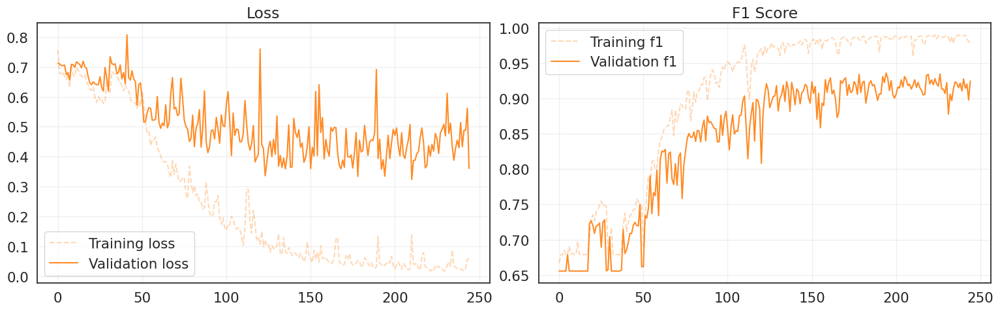

Accuracy over the validation set: 0.9357
Precision over the validation set: 0.9366
Recall over the validation set: 0.9357
F1 score over the validation set: 0.9358


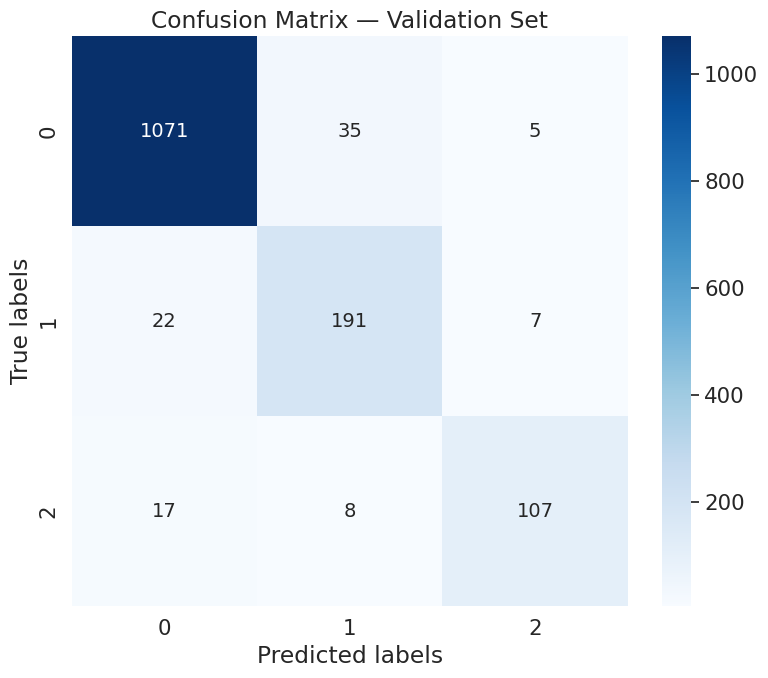

In [ ]:
# @title Plot Hitory
# Create a figure with two side-by-side subplots (two columns)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(training_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(training_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation accuracy on the second axis
ax2.plot(training_history['train_f1'], label='Training f1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(training_history['val_f1'], label='Validation f1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# @title Plot Confusion Matrix
# Collect predictions and ground truth labels
val_preds, val_targets = [], []
with torch.no_grad():  # Disable gradient computation for inference
    for xb, yb in val_loader:
        xb = xb.to(device)

        # Forward pass: get model predictions
        logits = rnn_model_lstm(xb)
        preds = logits.argmax(dim=1).cpu().numpy()

        # Store batch results
        val_preds.append(preds)
        val_targets.append(yb.numpy())

# Combine all batches into single arrays
val_preds = np.concatenate(val_preds)
val_targets = np.concatenate(val_targets)

# Calculate overall validation metrics
val_acc = accuracy_score(val_targets, val_preds)
val_prec = precision_score(val_targets, val_preds, average='weighted')
val_rec = recall_score(val_targets, val_preds, average='weighted')
val_f1 = f1_score(val_targets, val_preds, average='weighted')
print(f"Accuracy over the validation set: {val_acc:.4f}")
print(f"Precision over the validation set: {val_prec:.4f}")
print(f"Recall over the validation set: {val_rec:.4f}")
print(f"F1 score over the validation set: {val_f1:.4f}")

# Generate confusion matrix for detailed error analysis
cm = confusion_matrix(val_targets, val_preds)

# Create numeric labels for heatmap annotation
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)


######################################################################


# Visualise confusion matrix
plt.figure(figsize=(8, 7))
sns.heatmap(cm, annot=labels, fmt='',
            cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix — Validation Set')
plt.tight_layout()
plt.show()

# *Bi-LSTM*

## Parameters

In [ ]:
# Training configuration
LEARNING_RATE = 1e-3 # Different values tried : 1e-4, 5e-4, 1e-3
EPOCHS = 500         # Different values tried : 500
PATIENCE = 50        # Different values tried : 50

# Architecture
HIDDEN_LAYERS = 2    # Different values tried : 1, 2, 3, 4, 5, 6, 7, 8, 10
HIDDEN_SIZE = 128    # Different values tried : 32, 64, 125, 256, 512

# Regularisation
DROPOUT_RATE = 0.2   # Different values tried : 0, 0.01, 0.1, 0.2
L1_LAMBDA = 0.001    # DIfferent values tried : 0, 0.001, 0.01, 0.02
L2_LAMBDA = 0        # Different values tried : 0, 0.001, 0.01

# Loss function
criterion = nn.CrossEntropyLoss()

## Creating the model

In [ ]:
# Create model and display architecture with parameter count
rnn_model_bi_lstm = RecurrentClassifier(
    input_size=input_shape[-1], # Pass the number of features
    hidden_size=HIDDEN_SIZE,
    num_layers=HIDDEN_LAYERS,
    num_classes=num_classes,
    dropout_rate=DROPOUT_RATE,
    bidirectional=True,
    rnn_type='LSTM'
    ).to(device)
recurrent_summary(rnn_model_bi_lstm, input_size=input_shape)

# Set up TensorBoard logging and save model architecture
experiment_name = "bi_lstm"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
x = torch.randn(1, input_shape[0], input_shape[1]).to(device)
writer.add_graph(rnn_model_bi_lstm, x)

# Define optimizer with L2 regularization
optimizer = torch.optim.AdamW(rnn_model_bi_lstm.parameters(), lr=LEARNING_RATE, weight_decay=L2_LAMBDA)

# Enable mixed precision training for GPU acceleration
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

-------------------------------------------------------------------------------
Layer (type)              Output Shape                 Param #           
rnn (LSTM)                [[-1, 100, 256], [4, -1, 128]] 566,272        
classifier (Linear)       [-1, 3]                      771            
Total params: 567,043
Trainable params: 567,043
Non-trainable params: 0
-------------------------------------------------------------------------------


## Training the model

In [ ]:
%%time
# Train model and track training history
rnn_model_bi_lstm, training_history = fit(
    model=rnn_model_bi_lstm,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name="bi_lstm",
    patience=PATIENCE
    )

# Update best model if current performance is superior
if training_history['val_f1'][-1] > best_performance:
    best_model = rnn_model_bi_lstm
    best_performance = training_history['val_f1'][-1]

Training 500 epochs...
Epoch   1/500 | Train: Loss=0.7136, F1 Score=0.6758 | Val: Loss=0.6995, F1 Score=0.6555
Epoch   2/500 | Train: Loss=0.6069, F1 Score=0.7026 | Val: Loss=0.6459, F1 Score=0.7088
Epoch   3/500 | Train: Loss=0.5400, F1 Score=0.7678 | Val: Loss=0.6521, F1 Score=0.7443
Epoch   4/500 | Train: Loss=0.4907, F1 Score=0.7666 | Val: Loss=0.5010, F1 Score=0.7933
Epoch   5/500 | Train: Loss=0.4151, F1 Score=0.8383 | Val: Loss=0.5000, F1 Score=0.7867
Epoch   6/500 | Train: Loss=0.3797, F1 Score=0.8588 | Val: Loss=0.6349, F1 Score=0.7390
Epoch   7/500 | Train: Loss=0.3667, F1 Score=0.8608 | Val: Loss=0.4949, F1 Score=0.8339
Epoch   8/500 | Train: Loss=0.3424, F1 Score=0.8713 | Val: Loss=0.5170, F1 Score=0.8099
Epoch   9/500 | Train: Loss=0.3658, F1 Score=0.8737 | Val: Loss=0.5136, F1 Score=0.7935
Epoch  10/500 | Train: Loss=0.3202, F1 Score=0.8892 | Val: Loss=0.5296, F1 Score=0.7895
Epoch  11/500 | Train: Loss=0.2758, F1 Score=0.9031 | Val: Loss=0.5159, F1 Score=0.8189
Epoch  12

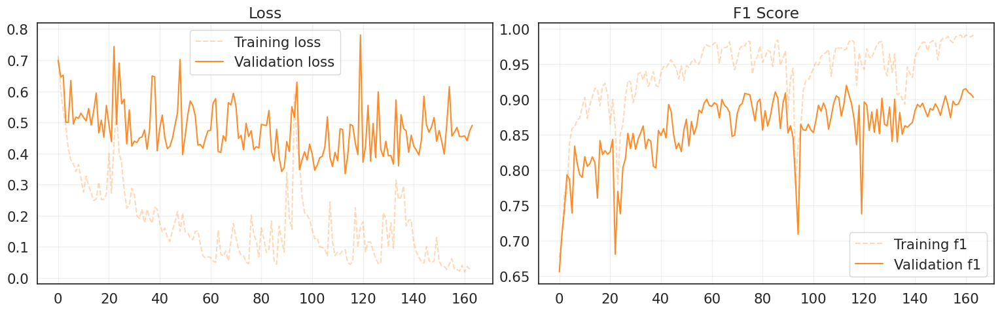

Accuracy over the validation set: 0.9241
Precision over the validation set: 0.9232
Recall over the validation set: 0.9241
F1 score over the validation set: 0.9200


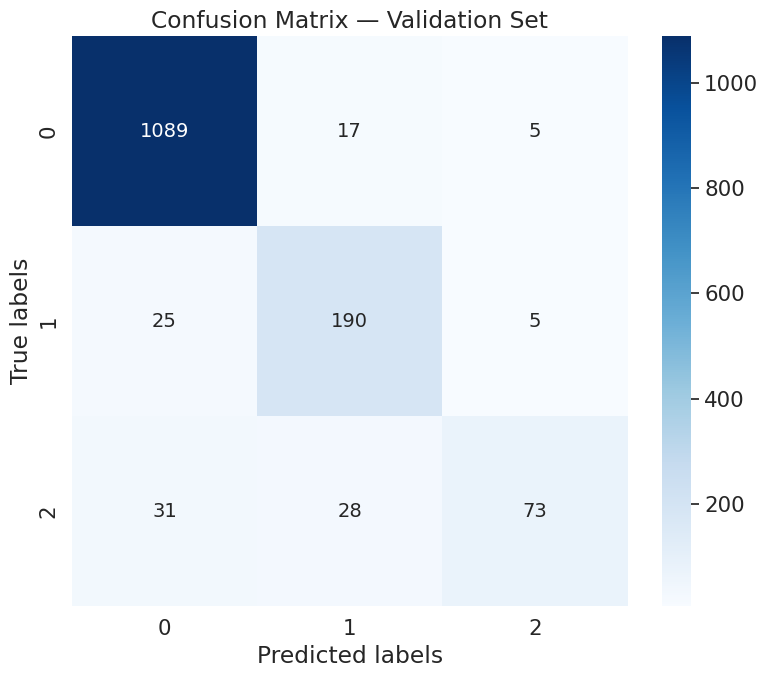

In [ ]:
# @title Plot Hitory
# Create a figure with two side-by-side subplots (two columns)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(training_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(training_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation accuracy on the second axis
ax2.plot(training_history['train_f1'], label='Training f1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(training_history['val_f1'], label='Validation f1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# @title Plot Confusion Matrix
# Collect predictions and ground truth labels
val_preds, val_targets = [], []
with torch.no_grad():  # Disable gradient computation for inference
    for xb, yb in val_loader:
        xb = xb.to(device)

        # Forward pass: get model predictions
        logits = rnn_model_bi_lstm(xb)
        preds = logits.argmax(dim=1).cpu().numpy()

        # Store batch results
        val_preds.append(preds)
        val_targets.append(yb.numpy())

# Combine all batches into single arrays
val_preds = np.concatenate(val_preds)
val_targets = np.concatenate(val_targets)

# Calculate overall validation metrics
val_acc = accuracy_score(val_targets, val_preds)
val_prec = precision_score(val_targets, val_preds, average='weighted')
val_rec = recall_score(val_targets, val_preds, average='weighted')
val_f1 = f1_score(val_targets, val_preds, average='weighted')
print(f"Accuracy over the validation set: {val_acc:.4f}")
print(f"Precision over the validation set: {val_prec:.4f}")
print(f"Recall over the validation set: {val_rec:.4f}")
print(f"F1 score over the validation set: {val_f1:.4f}")

# Generate confusion matrix for detailed error analysis
cm = confusion_matrix(val_targets, val_preds)

# Create numeric labels for heatmap annotation
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)


######################################################################


# Visualise confusion matrix
plt.figure(figsize=(8, 7))
sns.heatmap(cm, annot=labels, fmt='',
            cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix — Validation Set')
plt.tight_layout()
plt.show()

# *RNN*

## Parameters

In [ ]:
# Training configuration
LEARNING_RATE = 1e-3 # Different values tried : 1e-4, 5e-4, 1e-3
EPOCHS = 500         # Different values tried : 500
PATIENCE = 50        # Different values tried : 50

# Architecture
HIDDEN_LAYERS = 5    # Different values tried : 1, 2, 3, 4, 5, 6, 7, 8, 10
HIDDEN_SIZE = 128    # Different values tried : 32, 64, 125, 256, 512

# Regularisation
DROPOUT_RATE = 0.2   # Different values tried : 0, 0.01, 0.1, 0.2
L1_LAMBDA = 0.001    # DIfferent values tried : 0, 0.001, 0.01, 0.02
L2_LAMBDA = 0        # Different values tried : 0, 0.001, 0.01

# Loss function
criterion = nn.CrossEntropyLoss()

## Creating the model

In [ ]:
# Create model and display architecture with parameter count
rnn_model_rnn = RecurrentClassifier(
    input_size=input_shape[-1], # Pass the number of features
    hidden_size=HIDDEN_SIZE,
    num_layers=HIDDEN_LAYERS,
    num_classes=num_classes,
    dropout_rate=DROPOUT_RATE,
    bidirectional=False,
    rnn_type='RNN'
    ).to(device)
recurrent_summary(rnn_model_rnn, input_size=input_shape)

# Set up TensorBoard logging and save model architecture
experiment_name = "RNN"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
x = torch.randn(1, input_shape[0], input_shape[1]).to(device)
writer.add_graph(rnn_model_rnn, x)

# Define optimizer with L2 regularization
optimizer = torch.optim.AdamW(rnn_model_rnn.parameters(), lr=LEARNING_RATE, weight_decay=L2_LAMBDA)

# Enable mixed precision training for GPU acceleration
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

-------------------------------------------------------------------------------
Layer (type)              Output Shape                 Param #           
rnn (RNN)                 [[-1, 100, 128], [5, -1, 128]] 153,472        
classifier (Linear)       [-1, 3]                      387            
Total params: 153,859
Trainable params: 153,859
Non-trainable params: 0
-------------------------------------------------------------------------------


## Training the model

In [ ]:
%%time
# Train model and track training history
rnn_model_rnn, training_history = fit(
    model=rnn_model_rnn,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name="RNN",
    patience=PATIENCE
    )

# Update best model if current performance is superior
if training_history['val_f1'][-1] > best_performance:
    best_model = rnn_model_rnn
    best_performance = training_history['val_f1'][-1]

Training 500 epochs...
Epoch   1/500 | Train: Loss=0.7049, F1 Score=0.6768 | Val: Loss=0.7168, F1 Score=0.6555
Epoch   2/500 | Train: Loss=0.6838, F1 Score=0.6788 | Val: Loss=0.7130, F1 Score=0.6555
Epoch   3/500 | Train: Loss=0.6887, F1 Score=0.6788 | Val: Loss=0.7114, F1 Score=0.6555
Epoch   4/500 | Train: Loss=0.6806, F1 Score=0.6788 | Val: Loss=0.7006, F1 Score=0.6555
Epoch   5/500 | Train: Loss=0.6893, F1 Score=0.6811 | Val: Loss=0.7108, F1 Score=0.6555
Epoch   6/500 | Train: Loss=0.6849, F1 Score=0.6788 | Val: Loss=0.7115, F1 Score=0.6555
Epoch   7/500 | Train: Loss=0.6823, F1 Score=0.6788 | Val: Loss=0.7141, F1 Score=0.6555
Epoch   8/500 | Train: Loss=0.6824, F1 Score=0.6788 | Val: Loss=0.7146, F1 Score=0.6555
Epoch   9/500 | Train: Loss=0.6778, F1 Score=0.6788 | Val: Loss=0.7065, F1 Score=0.6555
Epoch  10/500 | Train: Loss=0.6636, F1 Score=0.6788 | Val: Loss=0.7068, F1 Score=0.6555
Epoch  11/500 | Train: Loss=0.6422, F1 Score=0.6788 | Val: Loss=0.6993, F1 Score=0.6555
Epoch  12

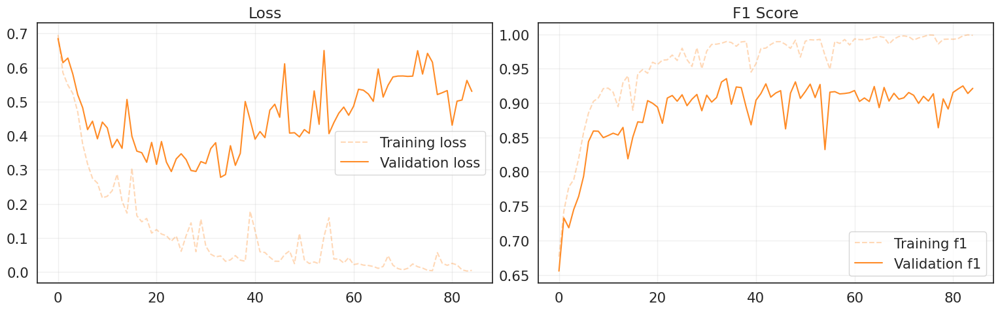

Accuracy over the validation set: 0.7731
Precision over the validation set: 0.7645
Recall over the validation set: 0.7731
F1 score over the validation set: 0.7085


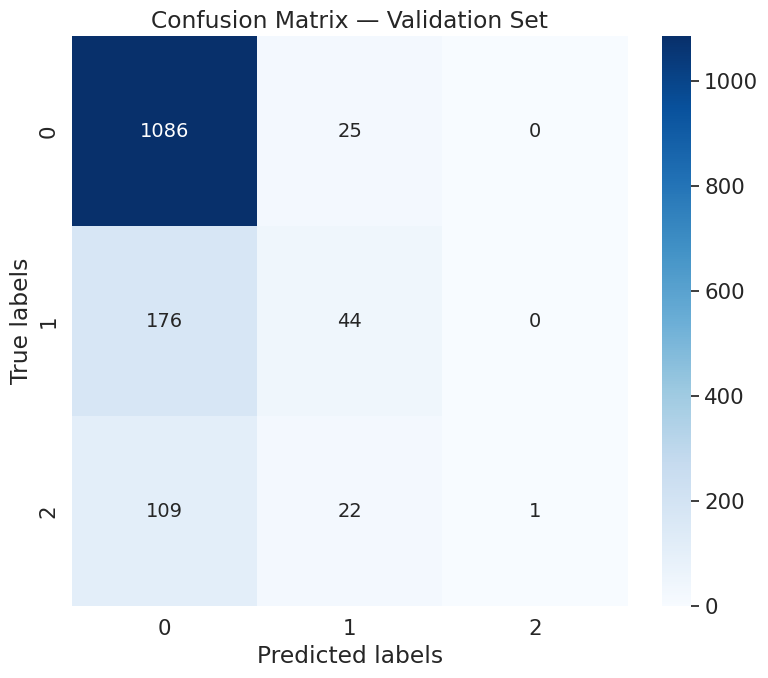

In [ ]:
# @title Plot Hitory
# Create a figure with two side-by-side subplots (two columns)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(training_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(training_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation accuracy on the second axis
ax2.plot(training_history['train_f1'], label='Training f1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(training_history['val_f1'], label='Validation f1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# @title Plot Confusion Matrix
# Collect predictions and ground truth labels
val_preds, val_targets = [], []
with torch.no_grad():  # Disable gradient computation for inference
    for xb, yb in val_loader:
        xb = xb.to(device)

        # Forward pass: get model predictions
        logits = rnn_model_rnn(xb)
        preds = logits.argmax(dim=1).cpu().numpy()

        # Store batch results
        val_preds.append(preds)
        val_targets.append(yb.numpy())

# Combine all batches into single arrays
val_preds = np.concatenate(val_preds)
val_targets = np.concatenate(val_targets)

# Calculate overall validation metrics
val_acc = accuracy_score(val_targets, val_preds)
val_prec = precision_score(val_targets, val_preds, average='weighted')
val_rec = recall_score(val_targets, val_preds, average='weighted')
val_f1 = f1_score(val_targets, val_preds, average='weighted')
print(f"Accuracy over the validation set: {val_acc:.4f}")
print(f"Precision over the validation set: {val_prec:.4f}")
print(f"Recall over the validation set: {val_rec:.4f}")
print(f"F1 score over the validation set: {val_f1:.4f}")

# Generate confusion matrix for detailed error analysis
cm = confusion_matrix(val_targets, val_preds)

# Create numeric labels for heatmap annotation
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)


######################################################################


# Visualise confusion matrix
plt.figure(figsize=(8, 7))
sns.heatmap(cm, annot=labels, fmt='',
            cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix — Validation Set')
plt.tight_layout()
plt.show()

# *Bi-RNN*

## Parameters

In [ ]:
# Training configuration
LEARNING_RATE = 1e-3 # Different values tried : 1e-4, 5e-4, 1e-3
EPOCHS = 500         # Different values tried : 500
PATIENCE = 50        # Different values tried : 50

# Architecture
HIDDEN_LAYERS = 2    # Different values tried : 1, 2, 3, 4, 5, 6, 7, 8, 10
HIDDEN_SIZE = 128    # Different values tried : 32, 64, 125, 256, 512

# Regularisation
DROPOUT_RATE = 0.2   # Different values tried : 0, 0.01, 0.1, 0.2
L1_LAMBDA = 0.001    # DIfferent values tried : 0, 0.001, 0.01, 0.02
L2_LAMBDA = 0        # Different values tried : 0, 0.001, 0.01

# Loss function
criterion = nn.CrossEntropyLoss()

## Creating the model

In [ ]:
# Create model and display architecture with parameter count
rnn_model_bi_rnn = RecurrentClassifier(
    input_size=input_shape[-1], # Pass the number of features
    hidden_size=HIDDEN_SIZE,
    num_layers=HIDDEN_LAYERS,
    num_classes=num_classes,
    dropout_rate=DROPOUT_RATE,
    bidirectional=True,
    rnn_type='RNN'
    ).to(device)
recurrent_summary(rnn_model_bi_rnn, input_size=input_shape)

# Set up TensorBoard logging and save model architecture
experiment_name = "bi_rnn"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
x = torch.randn(1, input_shape[0], input_shape[1]).to(device)
writer.add_graph(rnn_model_bi_rnn, x)

# Define optimizer with L2 regularization
optimizer = torch.optim.AdamW(rnn_model_bi_rnn.parameters(), lr=LEARNING_RATE, weight_decay=L2_LAMBDA)

# Enable mixed precision training for GPU acceleration
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

-------------------------------------------------------------------------------
Layer (type)              Output Shape                 Param #           
rnn (RNN)                 [[-1, 100, 256], [4, -1, 128]] 141,568        
classifier (Linear)       [-1, 3]                      771            
Total params: 142,339
Trainable params: 142,339
Non-trainable params: 0
-------------------------------------------------------------------------------


## Training the model

In [ ]:
%%time
# Train model and track training history
rnn_model_bi_rnn, training_history = fit(
    model=rnn_model_bi_rnn,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name="bi_rnn",
    patience=PATIENCE
    )

# Update best model if current performance is superior
if training_history['val_f1'][-1] > best_performance:
    best_model = rnn_model_bi_rnn
    best_performance = training_history['val_f1'][-1]

Training 500 epochs...
Epoch   1/500 | Train: Loss=0.6815, F1 Score=0.6783 | Val: Loss=0.7251, F1 Score=0.6558
Epoch   2/500 | Train: Loss=0.6937, F1 Score=0.7189 | Val: Loss=0.7182, F1 Score=0.6742
Epoch   3/500 | Train: Loss=0.6350, F1 Score=0.6895 | Val: Loss=0.7335, F1 Score=0.6561
Epoch   4/500 | Train: Loss=0.6488, F1 Score=0.7001 | Val: Loss=0.6746, F1 Score=0.6824
Epoch   5/500 | Train: Loss=0.6045, F1 Score=0.7285 | Val: Loss=0.6664, F1 Score=0.7141
Epoch   6/500 | Train: Loss=0.6474, F1 Score=0.7086 | Val: Loss=0.6800, F1 Score=0.6996
Epoch   7/500 | Train: Loss=0.5999, F1 Score=0.7318 | Val: Loss=0.6532, F1 Score=0.7149
Epoch   8/500 | Train: Loss=0.5874, F1 Score=0.7488 | Val: Loss=0.6751, F1 Score=0.7152
Epoch   9/500 | Train: Loss=0.5808, F1 Score=0.7526 | Val: Loss=0.6579, F1 Score=0.7210
Epoch  10/500 | Train: Loss=0.5676, F1 Score=0.7581 | Val: Loss=0.6528, F1 Score=0.7347
Epoch  11/500 | Train: Loss=0.5694, F1 Score=0.7513 | Val: Loss=0.6442, F1 Score=0.7292
Epoch  12

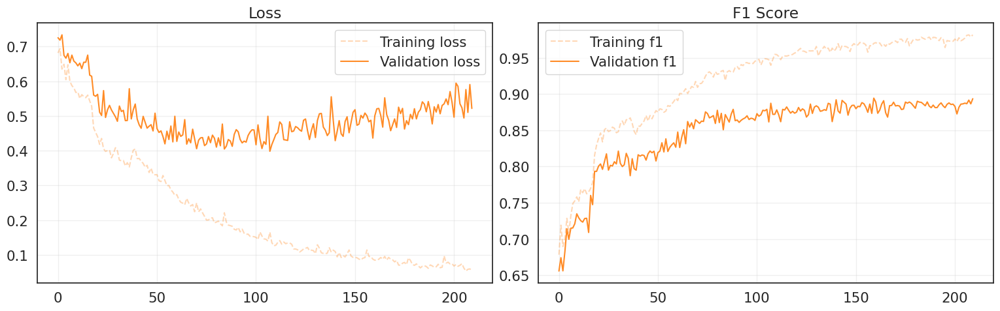

Accuracy over the validation set: 0.8975
Precision over the validation set: 0.8932
Recall over the validation set: 0.8975
F1 score over the validation set: 0.8942


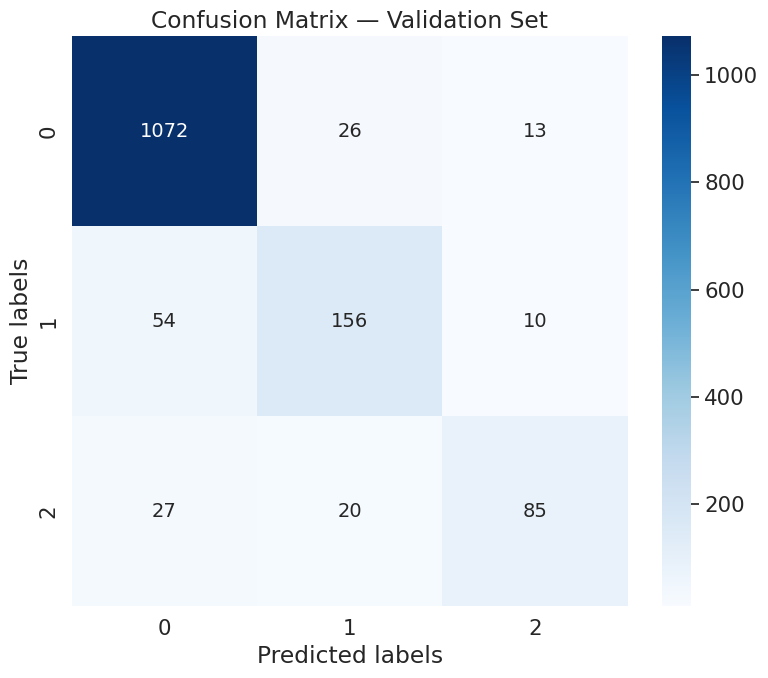

In [ ]:
# @title Plot Hitory
# Create a figure with two side-by-side subplots (two columns)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(training_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(training_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation accuracy on the second axis
ax2.plot(training_history['train_f1'], label='Training f1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(training_history['val_f1'], label='Validation f1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# @title Plot Confusion Matrix
# Collect predictions and ground truth labels
val_preds, val_targets = [], []
with torch.no_grad():  # Disable gradient computation for inference
    for xb, yb in val_loader:
        xb = xb.to(device)

        # Forward pass: get model predictions
        logits = rnn_model_bi_rnn(xb)
        preds = logits.argmax(dim=1).cpu().numpy()

        # Store batch results
        val_preds.append(preds)
        val_targets.append(yb.numpy())

# Combine all batches into single arrays
val_preds = np.concatenate(val_preds)
val_targets = np.concatenate(val_targets)

# Calculate overall validation metrics
val_acc = accuracy_score(val_targets, val_preds)
val_prec = precision_score(val_targets, val_preds, average='weighted')
val_rec = recall_score(val_targets, val_preds, average='weighted')
val_f1 = f1_score(val_targets, val_preds, average='weighted')
print(f"Accuracy over the validation set: {val_acc:.4f}")
print(f"Precision over the validation set: {val_prec:.4f}")
print(f"Recall over the validation set: {val_rec:.4f}")
print(f"F1 score over the validation set: {val_f1:.4f}")

# Generate confusion matrix for detailed error analysis
cm = confusion_matrix(val_targets, val_preds)

# Create numeric labels for heatmap annotation
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)


######################################################################


# Visualise confusion matrix
plt.figure(figsize=(8, 7))
sns.heatmap(cm, annot=labels, fmt='',
            cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix — Validation Set')
plt.tight_layout()
plt.show()

# *GRU*

## Parameters

In [ ]:
# Training configuration
LEARNING_RATE = 1e-3 # Different values tried : 1e-4, 5e-4, 1e-3
EPOCHS = 500         # Different values tried : 500
PATIENCE = 50        # Different values tried : 50

# Architecture
HIDDEN_LAYERS = 2    # Different values tried : 1, 2, 3, 4, 5, 6, 7, 8, 10
HIDDEN_SIZE = 128    # Different values tried : 32, 64, 125, 256, 512

# Regularisation
DROPOUT_RATE = 0.2   # Different values tried : 0, 0.01, 0.1, 0.2
L1_LAMBDA = 0.001    # DIfferent values tried : 0, 0.001, 0.01, 0.02
L2_LAMBDA = 0        # Different values tried : 0, 0.001, 0.01

# Loss function
criterion = nn.CrossEntropyLoss()

## Creating the model

In [ ]:
# Create model and display architecture with parameter count
rnn_model_gru = RecurrentClassifier(
    input_size=input_shape[-1], # Pass the number of features
    hidden_size=HIDDEN_SIZE,
    num_layers=HIDDEN_LAYERS,
    num_classes=num_classes,
    dropout_rate=DROPOUT_RATE,
    bidirectional=False,
    rnn_type='GRU'
    ).to(device)
recurrent_summary(rnn_model_gru, input_size=input_shape)

# Set up TensorBoard logging and save model architecture
experiment_name = "gru"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
x = torch.randn(1, input_shape[0], input_shape[1]).to(device)
writer.add_graph(rnn_model_gru, x)

# Define optimizer with L2 regularization
optimizer = torch.optim.AdamW(rnn_model_gru.parameters(), lr=LEARNING_RATE, weight_decay=L2_LAMBDA)

# Enable mixed precision training for GPU acceleration
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

-------------------------------------------------------------------------------
Layer (type)              Output Shape                 Param #           
rnn (GRU)                 [[-1, 100, 128], [2, -1, 128]] 163,200        
classifier (Linear)       [-1, 3]                      387            
Total params: 163,587
Trainable params: 163,587
Non-trainable params: 0
-------------------------------------------------------------------------------


## Training the model

In [ ]:
%%time
# Train model and track training history
rnn_model_gru, training_history = fit(
    model=rnn_model_gru,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name="gru",
    patience=PATIENCE
    )

# Update best model if current performance is superior
if training_history['val_f1'][-1] > best_performance:
    best_model = rnn_model_gru
    best_performance = training_history['val_f1'][-1]

Training 500 epochs...
Epoch   1/500 | Train: Loss=0.7327, F1 Score=0.6722 | Val: Loss=0.7095, F1 Score=0.6555
Epoch   2/500 | Train: Loss=0.6618, F1 Score=0.6813 | Val: Loss=0.6814, F1 Score=0.6616
Epoch   3/500 | Train: Loss=0.6204, F1 Score=0.7198 | Val: Loss=0.6777, F1 Score=0.6705
Epoch   4/500 | Train: Loss=0.5897, F1 Score=0.7371 | Val: Loss=0.6110, F1 Score=0.7200
Epoch   5/500 | Train: Loss=0.5435, F1 Score=0.7682 | Val: Loss=0.5915, F1 Score=0.7414
Epoch   6/500 | Train: Loss=0.5186, F1 Score=0.7800 | Val: Loss=0.5490, F1 Score=0.7520
Epoch   7/500 | Train: Loss=0.4677, F1 Score=0.7981 | Val: Loss=0.5099, F1 Score=0.7906
Epoch   8/500 | Train: Loss=0.3787, F1 Score=0.8430 | Val: Loss=0.4233, F1 Score=0.8141
Epoch   9/500 | Train: Loss=0.3322, F1 Score=0.8716 | Val: Loss=0.4893, F1 Score=0.8124
Epoch  10/500 | Train: Loss=0.3086, F1 Score=0.8935 | Val: Loss=0.4194, F1 Score=0.8292
Epoch  11/500 | Train: Loss=0.3224, F1 Score=0.8789 | Val: Loss=0.4027, F1 Score=0.8433
Epoch  12

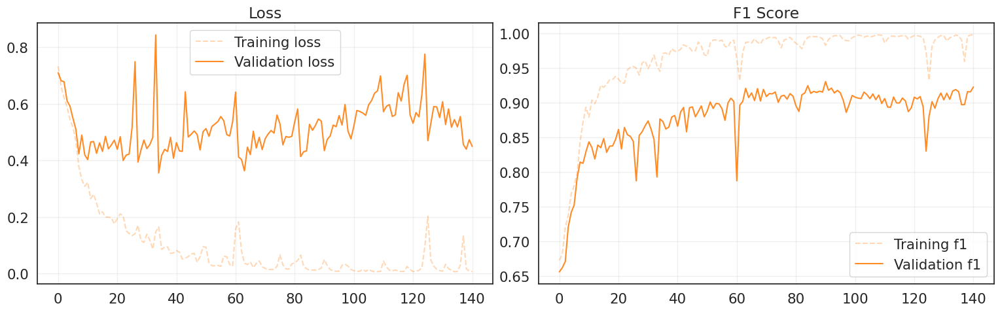

Accuracy over the validation set: 0.9337
Precision over the validation set: 0.9306
Recall over the validation set: 0.9337
F1 score over the validation set: 0.9304


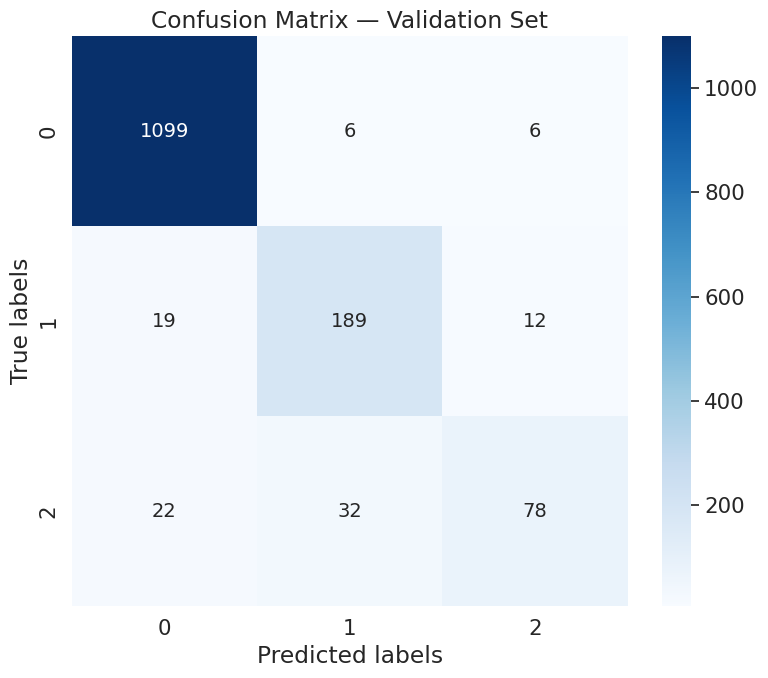

In [ ]:
# @title Plot Hitory
# Create a figure with two side-by-side subplots (two columns)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(training_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(training_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation accuracy on the second axis
ax2.plot(training_history['train_f1'], label='Training f1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(training_history['val_f1'], label='Validation f1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# @title Plot Confusion Matrix
# Collect predictions and ground truth labels
val_preds, val_targets = [], []
with torch.no_grad():  # Disable gradient computation for inference
    for xb, yb in val_loader:
        xb = xb.to(device)

        # Forward pass: get model predictions
        logits = rnn_model_gru(xb)
        preds = logits.argmax(dim=1).cpu().numpy()

        # Store batch results
        val_preds.append(preds)
        val_targets.append(yb.numpy())

# Combine all batches into single arrays
val_preds = np.concatenate(val_preds)
val_targets = np.concatenate(val_targets)

# Calculate overall validation metrics
val_acc = accuracy_score(val_targets, val_preds)
val_prec = precision_score(val_targets, val_preds, average='weighted')
val_rec = recall_score(val_targets, val_preds, average='weighted')
val_f1 = f1_score(val_targets, val_preds, average='weighted')
print(f"Accuracy over the validation set: {val_acc:.4f}")
print(f"Precision over the validation set: {val_prec:.4f}")
print(f"Recall over the validation set: {val_rec:.4f}")
print(f"F1 score over the validation set: {val_f1:.4f}")

# Generate confusion matrix for detailed error analysis
cm = confusion_matrix(val_targets, val_preds)

# Create numeric labels for heatmap annotation
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)


######################################################################


# Visualise confusion matrix
plt.figure(figsize=(8, 7))
sns.heatmap(cm, annot=labels, fmt='',
            cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix — Validation Set')
plt.tight_layout()
plt.show()

# *Bi-GRU*

## Parameters

In [ ]:
# Training configuration
LEARNING_RATE = 1e-3 # Different values tried : 1e-4, 5e-4, 1e-3
EPOCHS = 500         # Different values tried : 500
PATIENCE = 50        # Different values tried : 50

# Architecture
HIDDEN_LAYERS = 2    # Different values tried : 1, 2, 3, 4, 5, 6, 7, 8, 10
HIDDEN_SIZE = 128    # Different values tried : 32, 64, 125, 256, 512

# Regularisation
DROPOUT_RATE = 0.2   # Different values tried : 0, 0.01, 0.1, 0.2
L1_LAMBDA = 0.001    # DIfferent values tried : 0, 0.001, 0.01, 0.02
L2_LAMBDA = 0        # Different values tried : 0, 0.001, 0.01

# Loss function
criterion = nn.CrossEntropyLoss()

## Creating the model

In [ ]:
# Create model and display architecture with parameter count
rnn_model_bi_gru = RecurrentClassifier(
    input_size=input_shape[-1], # Pass the number of features
    hidden_size=HIDDEN_SIZE,
    num_layers=HIDDEN_LAYERS,
    num_classes=num_classes,
    dropout_rate=DROPOUT_RATE,
    bidirectional=True,
    rnn_type='GRU'
    ).to(device)
recurrent_summary(rnn_model_bi_gru, input_size=input_shape)

# Set up TensorBoard logging and save model architecture
experiment_name = "bi_gru"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
x = torch.randn(1, input_shape[0], input_shape[1]).to(device)
writer.add_graph(rnn_model_bi_gru, x)

# Define optimizer with L2 regularization
optimizer = torch.optim.AdamW(rnn_model_bi_gru.parameters(), lr=LEARNING_RATE, weight_decay=L2_LAMBDA)

# Enable mixed precision training for GPU acceleration
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

-------------------------------------------------------------------------------
Layer (type)              Output Shape                 Param #           
rnn (GRU)                 [[-1, 100, 256], [4, -1, 128]] 424,704        
classifier (Linear)       [-1, 3]                      771            
Total params: 425,475
Trainable params: 425,475
Non-trainable params: 0
-------------------------------------------------------------------------------


## Training the model

In [ ]:
%%time
# Train model and track training history
rnn_model_bi_gru, training_history = fit(
    model=rnn_model_bi_gru,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name="bi_gru",
    patience=PATIENCE
    )

# Update best model if current performance is superior
if training_history['val_f1'][-1] > best_performance:
    best_model = rnn_model_bi_gru
    best_performance = training_history['val_f1'][-1]

Training 500 epochs...
Epoch   1/500 | Train: Loss=0.6958, F1 Score=0.6765 | Val: Loss=0.6849, F1 Score=0.6555
Epoch   2/500 | Train: Loss=0.5845, F1 Score=0.7430 | Val: Loss=0.6141, F1 Score=0.7327
Epoch   3/500 | Train: Loss=0.5486, F1 Score=0.7781 | Val: Loss=0.6276, F1 Score=0.7185
Epoch   4/500 | Train: Loss=0.5239, F1 Score=0.7885 | Val: Loss=0.5810, F1 Score=0.7451
Epoch   5/500 | Train: Loss=0.4696, F1 Score=0.8193 | Val: Loss=0.5200, F1 Score=0.7642
Epoch   6/500 | Train: Loss=0.3757, F1 Score=0.8571 | Val: Loss=0.4822, F1 Score=0.7933
Epoch   7/500 | Train: Loss=0.3172, F1 Score=0.8855 | Val: Loss=0.4178, F1 Score=0.8439
Epoch   8/500 | Train: Loss=0.2750, F1 Score=0.9025 | Val: Loss=0.4425, F1 Score=0.8593
Epoch   9/500 | Train: Loss=0.2611, F1 Score=0.9076 | Val: Loss=0.3909, F1 Score=0.8590
Epoch  10/500 | Train: Loss=0.2177, F1 Score=0.9211 | Val: Loss=0.4399, F1 Score=0.8497
Epoch  11/500 | Train: Loss=0.2224, F1 Score=0.9217 | Val: Loss=0.4229, F1 Score=0.8528
Epoch  12

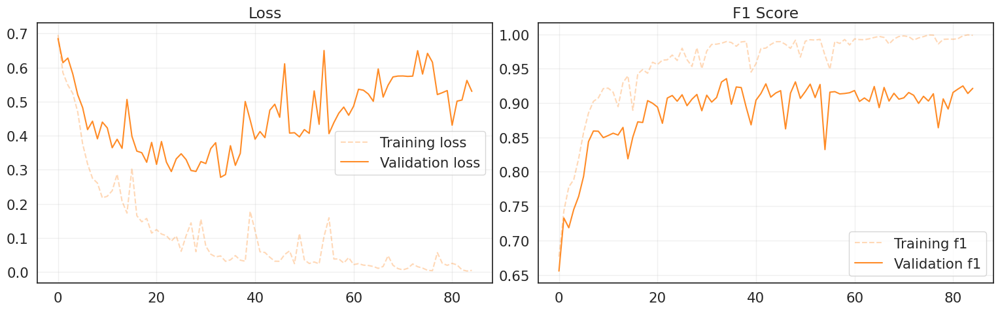

Accuracy over the validation set: 0.9378
Precision over the validation set: 0.9373
Recall over the validation set: 0.9378
F1 score over the validation set: 0.9356


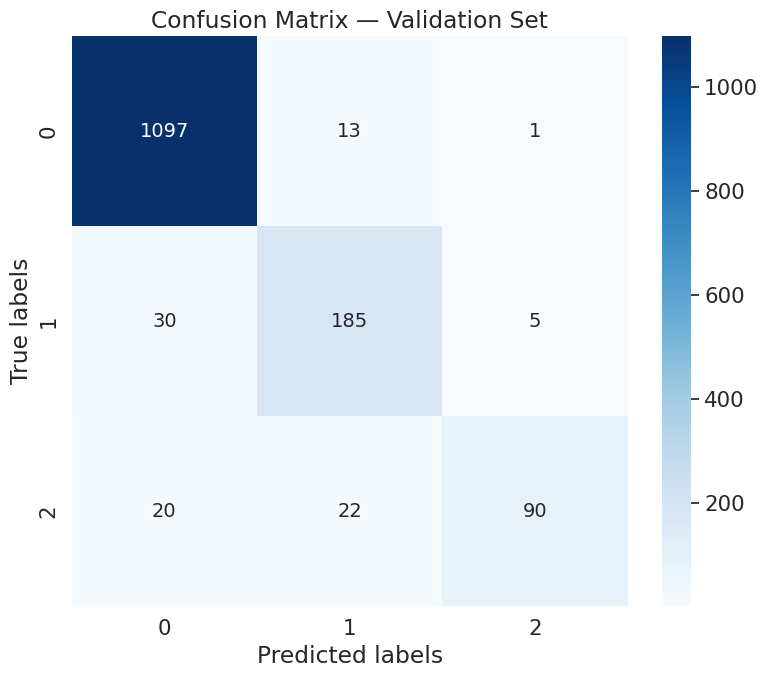

In [ ]:
# @title Plot Hitory
# Create a figure with two side-by-side subplots (two columns)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(training_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(training_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation accuracy on the second axis
ax2.plot(training_history['train_f1'], label='Training f1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(training_history['val_f1'], label='Validation f1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# @title Plot Confusion Matrix
# Collect predictions and ground truth labels
val_preds, val_targets = [], []
with torch.no_grad():  # Disable gradient computation for inference
    for xb, yb in val_loader:
        xb = xb.to(device)

        # Forward pass: get model predictions
        logits = rnn_model_bi_gru(xb)
        preds = logits.argmax(dim=1).cpu().numpy()

        # Store batch results
        val_preds.append(preds)
        val_targets.append(yb.numpy())

# Combine all batches into single arrays
val_preds = np.concatenate(val_preds)
val_targets = np.concatenate(val_targets)

# Calculate overall validation metrics
val_acc = accuracy_score(val_targets, val_preds)
val_prec = precision_score(val_targets, val_preds, average='weighted')
val_rec = recall_score(val_targets, val_preds, average='weighted')
val_f1 = f1_score(val_targets, val_preds, average='weighted')
print(f"Accuracy over the validation set: {val_acc:.4f}")
print(f"Precision over the validation set: {val_prec:.4f}")
print(f"Recall over the validation set: {val_rec:.4f}")
print(f"F1 score over the validation set: {val_f1:.4f}")

# Generate confusion matrix for detailed error analysis
cm = confusion_matrix(val_targets, val_preds)

# Create numeric labels for heatmap annotation
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)


######################################################################


# Visualise confusion matrix
plt.figure(figsize=(8, 7))
sns.heatmap(cm, annot=labels, fmt='',
            cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix — Validation Set')
plt.tight_layout()
plt.show()

# Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 55466), started 0:13:27 ago. (Use '!kill 55466' to kill it.)

<IPython.core.display.Javascript object>

# **K-Shuffle-Split Cross Validation**

In [ ]:
# Cross-validation
K = 5                    # Number of splits
VAL_SIZE = 0.2

# Training
EPOCHS = 250             # Maximum epochs
PATIENCE = 50            # Early stopping patience
VERBOSE = 10             # Print frequency

# Optimisation
LEARNING_RATE = 1e-3     # Learning rate
BATCH_SIZE = 128         # Batch size

# Architecture
HIDDEN_LAYERS = 2        # Hidden layers
HIDDEN_SIZE = 128        # Neurons per layer
RNN_TYPE = 'GRU'         # Type of RNN architecture
BIDIRECTIONAL = False    # Bidirectional RNN

# Regularisation
DROPOUT_RATE = 0.2       # Dropout probability
L1_LAMBDA = 0        # L1 penalty
L2_LAMBDA = 0            # L2 penalty

# Training utilities
criterion = nn.CrossEntropyLoss()

In [ ]:
def k_shuffle_split_cross_validation_round_rnn(
    X, y,
    epochs,
    criterion,
    device,
    k,
    val_size,
    batch_size,
    hidden_layers,
    hidden_size,
    learning_rate,
    dropout_rate,
    window_size,
    stride,
    rnn_type,
    bidirectional,
    l1_lambda=0,
    l2_lambda=0,
    patience=0,
    evaluation_metric="val_f1",
    mode='max',
    restore_best_weights=True,
    writer=None,
    verbose=10,
    seed=42,
    experiment_name=""
):

    fold_losses = {}
    fold_metrics = {}
    best_scores = {}

    in_features = len(features)   # list of feature columns
    num_classes = len(y["label"].unique())

    for split_idx in range(k):

        if verbose > 0:
            print(f"\nSplit {split_idx+1}/{k}")

        # Pirate-level split (train / val)
        unique_pirates = list(y["sample_index"].unique())

        train_pirates, val_pirates = train_test_split(
            unique_pirates,
            test_size=val_size,
            random_state=seed + split_idx,
            shuffle=True,
        )

        X_train_df = X[X["sample_index"].isin(train_pirates)].copy()
        y_train_df = y[y["sample_index"].isin(train_pirates)].copy()

        X_val_df = X[X["sample_index"].isin(val_pirates)].copy()
        y_val_df = y[y["sample_index"].isin(val_pirates)].copy()

        if verbose > 0:
            print(f"  Train pirates: {len(train_pirates)}")
            print(f"  Val pirates:   {len(val_pirates)}")
            print(f"  Train rows:    {X_train_df.shape}")
            print(f"  Val rows:      {X_val_df.shape}")

        # Min-max normalization
        train_max = X_train_df[features].max()
        train_min = X_train_df[features].min()

        for col in features:
            denom = (train_max[col] - train_min[col] + 1e-8)
            X_train_df[col] = (X_train_df[col] - train_min[col]) / denom
            X_val_df[col]   = (X_val_df[col]   - train_min[col]) / denom

        # Build windowed sequences
        X_train_seq, y_train_seq = build_sequences(
            X_train_df, y_train_df,
            window=window_size, stride=stride,
        )
        X_val_seq,   y_val_seq   = build_sequences(
            X_val_df,   y_val_df,
            window=window_size, stride=stride,
        )

        if verbose > 0:
            print(f"  Training windows:   {X_train_seq.shape}")
            print(f"  Validation windows: {X_val_seq.shape}")

        # Datasets & dataloaders
        train_ds = TensorDataset(
            torch.from_numpy(X_train_seq).float(),
            torch.from_numpy(y_train_seq).long(),
        )
        val_ds = TensorDataset(
            torch.from_numpy(X_val_seq).float(),
            torch.from_numpy(y_val_seq).long(),
        )

        train_loader = make_loader(
            train_ds,
            batch_size=batch_size,
            shuffle=True,
            drop_last=False,
        )
        val_loader = make_loader(
            val_ds,
            batch_size=batch_size,
            shuffle=False,
            drop_last=False,
        )

        # Model
        model = RecurrentClassifier(
            input_size=in_features,
            hidden_size=hidden_size,
            num_layers=hidden_layers,
            num_classes=num_classes,
            dropout_rate=dropout_rate,
            bidirectional=bidirectional,
            rnn_type=rnn_type,
        ).to(device)

        if split_idx == 0 and verbose > 0:
            # Summary
            recurrent_summary(model, input_size=(window_size, in_features))

        optimizer = torch.optim.AdamW(
            model.parameters(),
            lr=learning_rate,
            weight_decay=l2_lambda,
        )

        scaler = torch.amp.GradScaler(enabled=(device.type == "cuda"))

        os.makedirs(f"models/{experiment_name}", exist_ok=True)

        # Train
        model, training_history = fit(
            model=model,
            train_loader=train_loader,
            val_loader=val_loader,
            epochs=epochs,
            criterion=criterion,
            optimizer=optimizer,
            scaler=scaler,
            device=device,
            writer=writer,
            patience=patience,
            verbose=verbose,
            l1_lambda=l1_lambda,
            evaluation_metric=evaluation_metric,
            mode=mode,
            restore_best_weights=restore_best_weights,
            experiment_name=experiment_name + f"/split_{split_idx}",
        )

        fold_losses[f"split_{split_idx}"]  = training_history["val_loss"]
        fold_metrics[f"split_{split_idx}"] = training_history["val_f1"]
        best_scores[f"split_{split_idx}"]  = max(training_history["val_f1"])

    # Aggregate over splits
    split_keys = [k_ for k_ in best_scores if k_.startswith("split_")]
    best_scores["mean"] = np.mean([best_scores[k_] for k_ in split_keys])
    best_scores["std"] = np.std([best_scores[k_] for k_ in split_keys])

    if verbose > 0:
        print(f"\nBest score: {best_scores['mean']:.4f}±{best_scores['std']:.4f}")

    return fold_losses, fold_metrics, best_scores


In [ ]:
%%time
# Execute K-fold cross-validation with baseline configuration
fold_losses, fold_metrics, best_scores = k_shuffle_split_cross_validation_round_rnn(
    X, y,
    epochs=EPOCHS,
    criterion=criterion,
    device=device,
    k=K,
    val_size=VAL_SIZE,
    batch_size=BATCH_SIZE,
    hidden_layers=HIDDEN_LAYERS,
    hidden_size=HIDDEN_SIZE,
    learning_rate=LEARNING_RATE,
    dropout_rate=DROPOUT_RATE,
    window_size=WINDOW_SIZE,
    stride=STRIDE,
    rnn_type='GRU',
    bidirectional=False,
    l1_lambda=L1_LAMBDA,
    l2_lambda=L2_LAMBDA,
    patience=PATIENCE,
    evaluation_metric="val_f1",
    mode='max',
    restore_best_weights=True,
    writer=None,
    verbose=VERBOSE,
    seed=SEED,
    experiment_name="gru_kfold"
)



Split 1/5
  Train pirates: 528
  Val pirates:   133
  Train rows:    (84480, 40)
  Val rows:      (21280, 40)
  Training windows:   (5808, 100, 37)
  Validation windows: (1463, 100, 37)
-------------------------------------------------------------------------------
Layer (type)              Output Shape                 Param #           
rnn (GRU)                 [[-1, 100, 128], [2, -1, 128]] 163,200        
classifier (Linear)       [-1, 3]                      387            
Total params: 163,587
Trainable params: 163,587
Non-trainable params: 0
-------------------------------------------------------------------------------
Training 250 epochs...
Epoch   1/250 | Train: Loss=0.7363, F1 Score=0.6608 | Val: Loss=0.6069, F1 Score=0.7174
Epoch  10/250 | Train: Loss=0.3176, F1 Score=0.8899 | Val: Loss=0.5692, F1 Score=0.8031
Epoch  20/250 | Train: Loss=0.2147, F1 Score=0.9239 | Val: Loss=0.3784, F1 Score=0.8721
Epoch  30/250 | Train: Loss=0.1531, F1 Score=0.9543 | Val: Loss=0.3401, F1 S

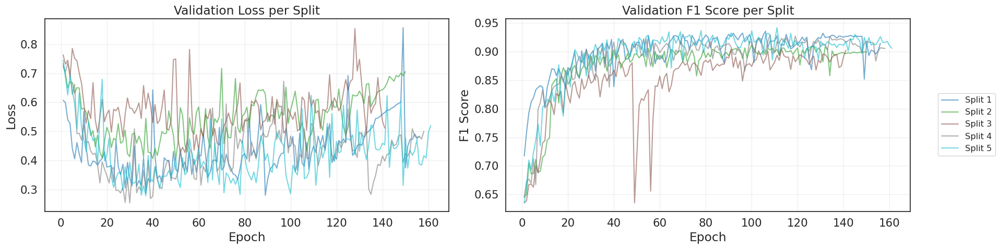

In [ ]:
def plot_kfold_history(fold_losses, fold_metrics, patience=0):
    """
    Plot validation loss and F1 history for each K-fold split.

    Args:
        fold_losses (dict): keys 'split_0', 'split_1', ... mapped to list of val losses.
        fold_metrics (dict): keys 'split_0', 'split_1', ... mapped to list of val F1 scores.
        patience (int): early stopping patience used during training.
    """
    # Infer K from the dict keys
    split_keys = sorted([k for k in fold_losses.keys() if k.startswith("split_")])
    K = len(split_keys)

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 5), sharex=True)

    # Color palette for K splits
    colors = plt.cm.get_cmap('tab10', K)

    # Plot validation loss
    for i, key in enumerate(split_keys):
        loss_history = fold_losses[key]

        if patience > 0 and len(loss_history) > patience:
            loss_history = loss_history[:-patience]

        epochs_range = range(1, len(loss_history) + 1)
        axes[0].plot(epochs_range, loss_history,
                     label=f'Split {i+1}',
                     color=colors(i),
                     alpha=0.6)

    axes[0].set_title('Validation Loss per Split')
    axes[0].set_ylabel('Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].grid(alpha=0.3)

    # Plot validation F1
    for i, key in enumerate(split_keys):
        f1_history = fold_metrics[key]

        if patience > 0 and len(f1_history) > patience:
            f1_history = f1_history[:-patience]

        epochs_range = range(1, len(f1_history) + 1)
        axes[1].plot(epochs_range, f1_history,
                     label=f'Split {i+1}',
                     color=colors(i),
                     alpha=0.6)

    axes[1].set_title('Validation F1 Score per Split')
    axes[1].set_ylabel('F1 Score')
    axes[1].set_xlabel('Epoch')
    axes[1].grid(alpha=0.3)

    # Shared legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='center left',
               bbox_to_anchor=(1, 0.5), fontsize='small')

    plt.tight_layout()
    plt.subplots_adjust(right=0.975)
    plt.show()

plot_kfold_history(fold_losses, fold_metrics)

# **Submission csv file**

The goal of this section is to predict the pain levels for the X_final_test.

We will create the dataframe with the predictions and put it in a csv file.

In [ ]:
X_final_test = pd.read_csv("data/pirate_pain_test.csv")
X_final_test['n_eyes'] = X_final_test['n_eyes'].map(eyes_mapping)
X_final_test['n_hands'] = X_final_test['n_hands'].map(hands_mapping)
X_final_test['n_legs'] = X_final_test['n_legs'].map(legs_mapping)

## Normalization

In [ ]:
# Apply normalisation to the specified columns in all datasets
for column in features:
    # Normalise the training set
    X_final_test[column] = X_final_test[column].astype(np.float32)
    X_final_test[column] = (X_final_test[column] - mins[column]) / (maxs[column] - mins[column])

In [ ]:
def create_dataset(df, label_df=False):
  dataset = []
  labels = []
  for pirate in df.sample_index.unique():
    temp = df[df.sample_index == pirate][features].values.astype(np.float32)
    dataset.append(temp)
    if isinstance(label_df, pd.DataFrame):
      label = label_df[label_df.sample_index == pirate].label.values[0]
      labels.append(label)

  dataset = np.array(dataset)

  if isinstance(label_df, pd.DataFrame):
    labels = np.array(labels)
    return dataset, labels
  return dataset

In [ ]:
X_input = create_dataset(X_final_test)

In [ ]:
print(X_input.shape)

(1324, 160, 37)


In [ ]:
test_final_ds = TensorDataset(torch.from_numpy(X_input))
test_final_loader  = make_loader(test_final_ds, batch_size=1, shuffle=False, drop_last=False)

# Get one batch from the training data loader
for xb in test_final_loader:
    print("Features batch shape:", xb[0].shape)
    break # Stop after getting one batch

Features batch shape: torch.Size([1, 160, 37])


In [ ]:
def create_submission(rnn_model, test_final_loader, csv_filename):
  rnn_model.eval()  # Set model to evaluation mode
  all_predictions = []

  # Disable gradient computation for validation
  with torch.no_grad():
      for inputs_tuple in test_final_loader:
          inputs = inputs_tuple[0].to(device) # Unpack the tuple and move the tensor to device

          # Forward pass with mixed precision (if CUDA available)
          with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
              logits = rnn_model(inputs)
              predictions = logits.argmax(dim=1)
              all_predictions.append(predictions.cpu().numpy())

  predictions_final = np.concatenate(all_predictions)

  # Inverse map the labels to original string format
  inverse_label_mapping = {v: k for k, v in label_mapping.items()}
  predictions_final_mapped = [inverse_label_mapping[pred] for pred in predictions_final]

  # Create submission DataFrame
  submission_df = pd.DataFrame({
      'sample_index': X_final_test['sample_index'].unique(),
      'label': predictions_final_mapped
  })

  # Save to CSV
  submission_df.to_csv(f'{csv_filename}.csv', index=False)

  return submission_df

In [ ]:
submission_gru_df = create_submission(rnn_model_gru, test_final_loader, "submission_gru")

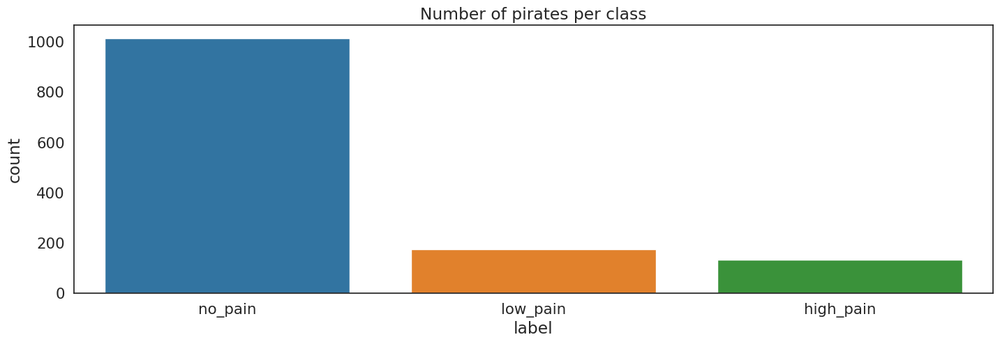

In [ ]:
plt.figure(figsize=(17, 5))
sns.countplot(
    x='label',
    data=submission_gru_df,
    order=submission_gru_df['label'].value_counts().index,
    palette='tab10'
)

# Set the title of the plot
plt.title("Number of pirates per class")

# Display the plot
plt.show()